In [9]:
import os   #used for directory work
import matplotlib.patches as mpatches #used for plot legends
import matplotlib.pyplot as plt #used for creating plots
import matplotlib.cm as cm
import pandas as pd
import numpy as np
%matplotlib inline

In [22]:
#path="/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-1/sonics/" #79 location
#path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-2/sonics/"  #134 location
path = "/Users/joeyp//Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Full-Timestamp/Burn-02/sonics/"

In [23]:
def text_finder(path):
    txt_files=[]
    all_files = os.listdir(path) #tells what directory the files are in
    for i in all_files: #reading only the .txt files 
        if i[-4:] == ".txt":
            txt_files.append(i)
    txt_files.sort() #alphabetizes them
    
    return txt_files

def file_to_df(path):
    df= pd.read_csv(path,na_values = ['NAN', "00nan","000nan","NaN"], sep=" ")
    
    return df

def fire_start(df,pre_brn_start, pre_brn_end):    
    ### Finding the start of fire
    x_fire, fire_5sig = 9e10, np.nanmean(df["T"][pre_brn_start:pre_brn_end]) + \
                    5*np.std(df["T"][pre_brn_start:pre_brn_end]) 
    for i in range(len(df["T"])):
        if df["T"][i] > fire_5sig:
            x_fire = i
            break
    
    return x_fire

In [275]:
n_list = [21000,15000,20000,30000,15000,6000,25000,18000,30000,60000,50000,180000,40000,25000,25000,27000,\
         45000,20000,25000,25000,35000,27000,25000,15000,35000,45000,20000,40000]
def Burn_Calculations(path, n):
    txt_files = text_finder(path)
    df_list, x_fire_lst = [], []
    for i in range(16):
        df = file_to_df(path + txt_files[i])
        x_fire_lst.append(fire_start(df))
        df_list.append(df)

    n_fire = min(x_fire_lst)
    
    Calculations

def Calculations(df, n, x_fire):
    #30mins = 18000 15mins = 9000 10mins = 6000 5mins = 3000
    pre_brn_ave_t, brn_ave_t = 9000, 9000
    ### pre-burn averaging index

    pre_brn_start, pre_brn_end = 0, n
    if n > pre_brn_ave_t:
        pre_brn_start = n - pre_brn_ave_t #Making the pre-burn period max time of 30 min

    pre_brn_len = pre_brn_end - pre_brn_start
    #print(pre_brn_start,pre_brn_end)

    ### Getting the pre-fire averages
    U_mean = np.nanmean(df["U"][pre_brn_start:pre_brn_end])
    V_mean = np.nanmean(df["V"][pre_brn_start:pre_brn_end])
    W_mean = np.nanmean(df["W"][pre_brn_start:pre_brn_end])
    T_mean = np.nanmean(df["T"][pre_brn_start:pre_brn_end])
    ### Creating te Prime Lists

    U_prime, V_prime = list(np.full(len(df),np.nan)), list(np.full(len(df),np.nan))
    W_prime, T_prime = list(np.full(len(df),np.nan)), list(np.full(len(df),np.nan))
    for i in range(len(df)):
        U_prime[i] = df["U"][i] - U_mean
        V_prime[i] = df["V"][i] - V_mean
        W_prime[i] = df["W"][i] - W_mean
        T_prime[i] = df["T"][i] - T_mean

    tke_list = list(np.full(len(df),np.nan))
    for i in range(len(df)):
        tke_list[i] = (U_prime[i]**2 + V_prime[i]**2 +W_prime[i]**2)/2

    pre_tke_lst = tke_list[pre_brn_start:pre_brn_end]
    pre_W_lst, pre_T_lst = W_prime[pre_brn_start:pre_brn_end], T_prime[pre_brn_start:pre_brn_end]   

    #x_fire = fire_start(df,pre_brn_start, pre_brn_end)
    brn_n = len(df[x_fire:])

    fire_end = len(df)-1 #the end of the fire period 
    if brn_n > brn_ave_t:
        fire_end = x_fire + brn_ave_t #30mins after the fire
        brn_n = len(df[x_fire:fire_end])

    brn_tke_lst = tke_list[x_fire:fire_end]
    brn_W_lst, brn_T_lst = W_prime[x_fire:fire_end], T_prime[x_fire:fire_end]

    return pre_tke_lst, pre_T_lst, pre_W_lst, brn_tke_lst, brn_T_lst, brn_W_lst

In [276]:
files = text_finder(path)
df = file_to_df(path+files[0])
pre_tke_lst, pre_T_lst, pre_W_lst, brn_tke_lst, brn_T_lst, brn_W_lst = Calculations(df,n_list[1])

FileNotFoundError: [WinError 3] The system cannot find the path specified: '/Users/joeyp/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Full-Timestamp/Burn-'

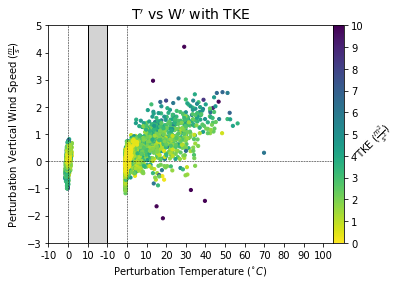

In [159]:
fig, ax = plt.subplots()
#fig.set_size_inches(16, 10)

ax = plt.subplot(1,1,1)

#labels
ax.set_xlabel(r'Perturbation Temperature ($^{\circ}C$) ', fontsize=10)
ax.set_ylabel(r'Perturbation Vertical Wind Speed ($\frac{m}{s}$)',rotation =90, fontsize=10 )
title= r"T${}'$ vs W${}'$ with TKE " #+ file_name[:2]
ax.set_title(title, fontsize = 14)

#c sequence
c = brn_tke_lst
#cm = plt.cm.get_cmap('jet')
cm = plt.cm.get_cmap('viridis_r')
#cm = plt.cm.get_cmap('gnuplot')
#plot
plt.hlines(0,-10,10,linestyle= "--",  linewidth=.5)
plt.hlines(0,20,1000,linestyle= "--",  linewidth=.5)
#plt.vlines(15,10,1000,linestyle= "--",  linewidth=.5)
plt.vlines(0,-10,100,linestyle= "--",  linewidth=.5)
plt.vlines(30,-10,100,linestyle= "--",  linewidth=.5)
y1=plt.vlines(10,-10,100,linewidth=1)
y2=plt.vlines(20,-10,100,linewidth=1)
plt.scatter( pre_T_lst, pre_W_lst , c=pre_tke_lst, 
            cmap =cm, alpha = 1, s= 10, marker = "o" )
plt.scatter( [x + 30 for x in brn_T_lst] , brn_W_lst , c=brn_tke_lst, 
            cmap =cm, alpha = 1, s= 10, marker = "o" )
cbar = plt.colorbar(pad=0)
cbar.set_label(r'TKE ($\frac{m^{2}}{s^{2}}$)', rotation=45, fontsize=10)
plt.axvspan(10, 20, color='lightgrey')
plt.clim(0,10)
x_tick_loc =  [-10, 0, 10,  20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130]
x_tick_name = [-10, 0, 10, -10,  0, 10, 20, 30, 40, 50, 60, 70,  80,  90, 100]
cbar.set_ticks([0,1,2,3,4,5,6,7,8,9,10])
plt.xticks(x_tick_loc,x_tick_name)
plt.xlim(-10,135)
plt.ylim(-3,5)
plt.show()

In [3]:
def calculations(df, n):
   
    U_average = np.mean(df["U"][:n])
    V_average = np.mean(df["V"][:n])
    W_average = np.mean(df["W"][:n])
    T_average = np.mean(df["T"][:n])

    tke_lst, V_prime, U_prime, W_prime, T_prime = [], [], [], [], []
    for i in range(len(df)):
        tke_lst.append(((df["U"][i] - U_average)**2 +(df["V"][i] - V_average)**2 + (df["W"][i]-W_average)**2)/2)
        V_prime.append(df["V"][i]-V_average)
        U_prime.append(df["U"][i]-V_average)
        W_prime.append(df["W"][i]-W_average)
        T_prime.append(df["T"][i]-T_average)
        
    return tke_lst, W_prime, T_prime, V_prime, U_prime 

In [26]:
tke_lst, W_prime, T_prime, V_prime, U_prime  = calculations(df,16000)

NameError: name 'df' is not defined

In [4]:
def tke_plots(df,file_name,n):
    tke_lst, W_prime, T_prime, V_prime, U_prime  = calculations(df,n)
    #figure
    fig, ax = plt.subplots()
    fig.set_size_inches(16, 10)

    ax = plt.subplot(1,1,1)

    #labels
    ax.set_xlabel(r'Perturbation Temperature ($^{\circ}C$) ', fontsize=10)
    ax.set_ylabel(r'Perturbation Vertical Wind Speed ($\frac{m}{s}$)',rotation =90, fontsize=10 )
    title= r"T${}'$ vs W${}'$ with TKE "+ file_name[:2]
    ax.set_title(title, fontsize = 14)

    #c sequence
    c = tke_lst
    #cm = plt.cm.get_cmap('jet')
    cm = plt.cm.get_cmap('viridis_r')
    #cm = plt.cm.get_cmap('gnuplot')
    #plot
    plt.hlines(0,-50,100,linestyle= "--",  linewidth=.5)
    plt.vlines(0,-10,10,linestyle= "--",  linewidth=.5)
    plt.scatter( T_prime, W_prime , c=c, 
                cmap =cm, alpha = .7, s= 12 )# s = df['T']*.5, alpha =0.5)
    cbar = plt.colorbar(pad=0)
    cbar.set_label(r'TKE ($\frac{m^{2}}{s^{2}}$)', rotation=45, fontsize=10)
    
    plt.clim(0,10)
    cbar.set_ticks([0,1,2,3,4,5,6,7,8,9,10])
    plt.xlim(-5,100)
    plt.ylim(-3,5)
    plt.show()
    fig.savefig(str(file_name[:2])+'TKE_plot.png')

In [28]:
for i in range(len(all_files)-1):
    df = pd.read_csv(path + txt_files[i],na_values = ['NAN', "00nan"], sep="\t")
    tke_plots(df,all_files[i],16000)

NameError: name 'all_files' is not defined

In [277]:
def tke_grid(path,n,burn,seperator = " "):
    cm = plt.cm.get_cmap('viridis_r')
    fig, axs = plt.subplots(nrows=4,ncols=4,figsize=(22,18))#, sharex=True, sharey=True)
    #fig.set_size_inches(20, 16)
    txt_files = text_finder(path)
    x=0
    for col in range(4):
        for row in range(4):
            #read in the data and compute means
            df = pd.read_csv(path + txt_files[x],na_values = ['NAN', "00nan"], sep=seperator)  
            pre_tke_lst, pre_T_lst, pre_W_lst, brn_tke_lst, brn_T_lst, brn_W_lst  = Calculations(df,n)
            
            #create the scatter subplots
            ax = axs[ col, row]
            pcm1 =ax.scatter(pre_T_lst, pre_W_lst , c=pre_tke_lst,\
                cmap =cm, alpha = .8, s= 8,vmin = 0, vmax=10)
            pcm2 = ax.scatter([x + 30 for x in brn_T_lst] , brn_W_lst , c=brn_tke_lst,\
                    cmap =cm, alpha = .8, s= 8,vmin = 0, vmax=10)
            
            
            #Set the colorbar
            cbar = fig.colorbar(pcm2, ax = ax, pad =0)
            
            #titles and formating 
            ax.set_title(txt_files[x][:2], fontsize = 18)
            ax.text(-10,5.1,"Pre-Fire", fontsize = 12)
            ax.text(30,5.1, "Fire", fontsize = 12)
            if row== 0:
                ax.set_ylabel(r"W ${}'$ ($\frac{m}{s}$)",rotation =90, fontsize=18,labelpad=0 )
            if row == 3:
                cbar.set_label(r'TKE ($\frac{m^{2}}{s^{2}}$)', rotation=90, fontsize=18,x=0.5,y=0.5)
            if col == 3:
                ax.set_xlabel(r"T${}'$($^{\circ}C$) ", fontsize=18)
            
            
            ax.hlines(0,-10,10,linestyle= "--",  linewidth=.5)
            ax.hlines(0,20,1000,linestyle= "--",  linewidth=.5)
            ax.vlines(15,10,1000,linestyle= "--",  linewidth=.5)
            ax.vlines(0,-10,100,linestyle= "--",  linewidth=.5)
            ax.vlines(30,-10,100,linestyle= "--",  linewidth=.5)
            ax.axvspan(10, 20, color='lightgrey')
            ax.vlines(10,-10,100,linewidth=1)
            ax.vlines(20,-10,100,linewidth=1)
            ax.set_xlim(-10,135)
            ax.set_ylim(-3,5)
            #x_tick_loc =  [-10, 0, 10,  20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130]
            #x_tick_name = [-10, 0, 10, -10,  0, 10, 20, 30, 40, 50, 60, 70,  80,  90, 100]
            x_tick_loc =  [-10, 0, 10,  20, 30, 40, 60, 80, 100, 120]
            x_tick_name = [-10, 0, 10, -10,  0, 10, 30, 50,  70,  90]
            ax.set_xticks(x_tick_loc)
            ax.set_xticklabels(x_tick_name)
            x=x+1 #used to change the files

    #adjust the spacingof the plots       
    fig.suptitle(burn+' Perturbation Temperature by Perturbation Verticle Wind Speed With TKE ', fontsize = 22, x=0.5, y=.9)
    cbar.set_ticks([0,1,2,3,4,5,6,7,8,9,10])
    
    #fig.text(0.015,-1,r"W ${}'$ ($\frac{m}{s}$)", rotation  = 90, fontsize = 18)
    #fig.text(0.015,0.3,r"W ${}'$ ($\frac{m}{s}$)", rotation  = 90, fontsize = 18)
    #fig.text(0.015,0.6,r"W ${}'$ ($\frac{m}{s}$)", rotation  = 90, fontsize = 18)
    #fig.text(0.015,0.85,r"W ${}'$ ($\frac{m}{s}$)", rotation  = 90, fontsize = 18)
    #fig.text(0.97, 0.375,"Burn Duration (mins)", rotation = 270, fontsize = 18)
    #fig.text(0.48,0.015, r"T${}'$($^{\circ}C$) ", fontsize = 18)
    fig.tight_layout()
    fig.subplots_adjust(hspace=0.2,wspace=0.1, top=.85, left = 0.05, right = .95, bottom = .07)
    
    fig.savefig("brn_v_pre"+burn+"_T-W-tke_Grid.png",dpi=250)
    plt.show()

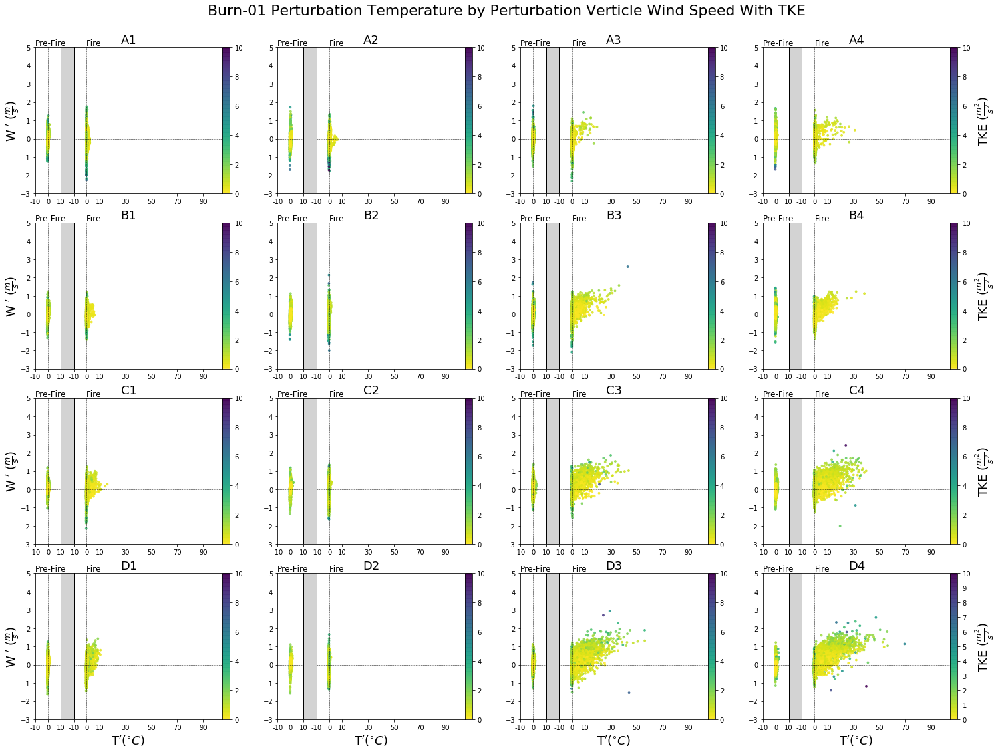

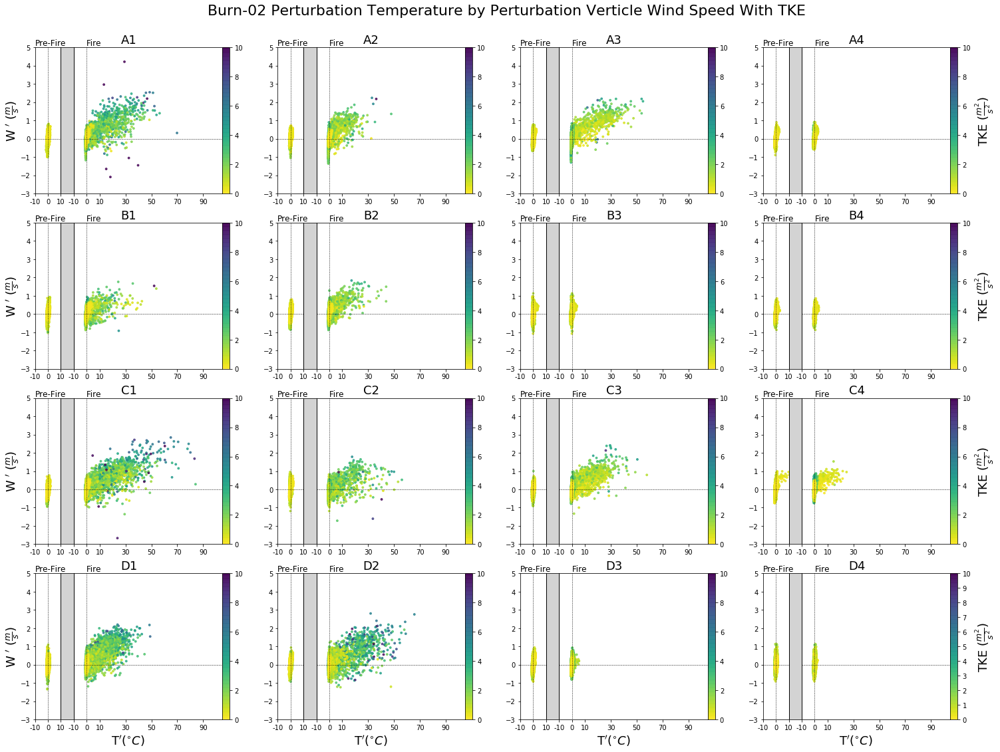

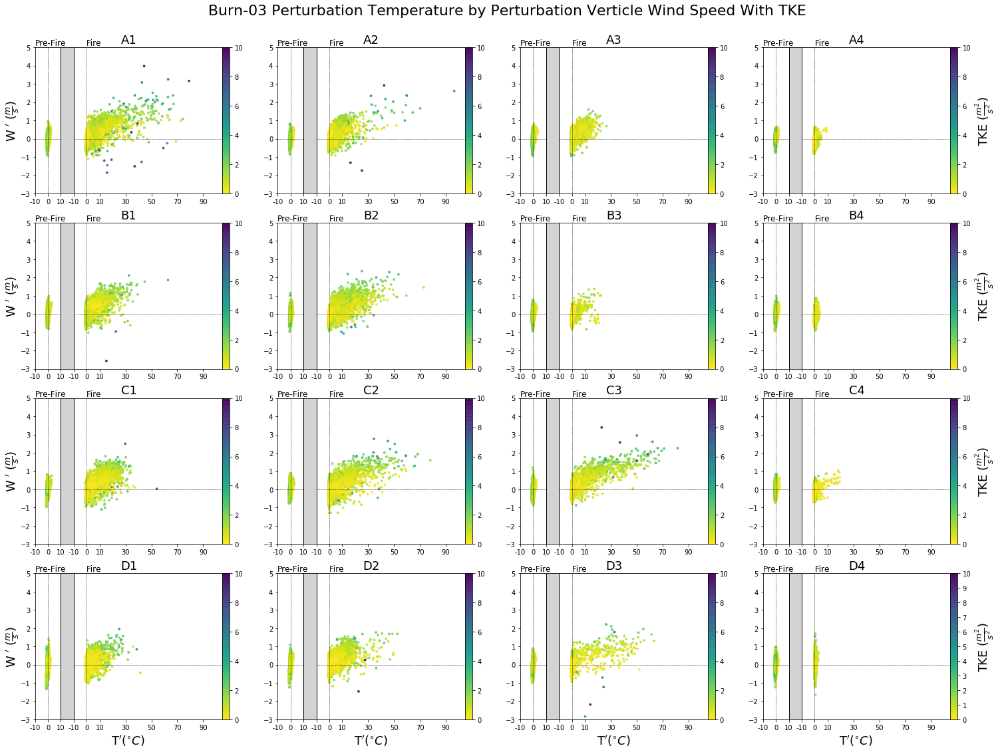

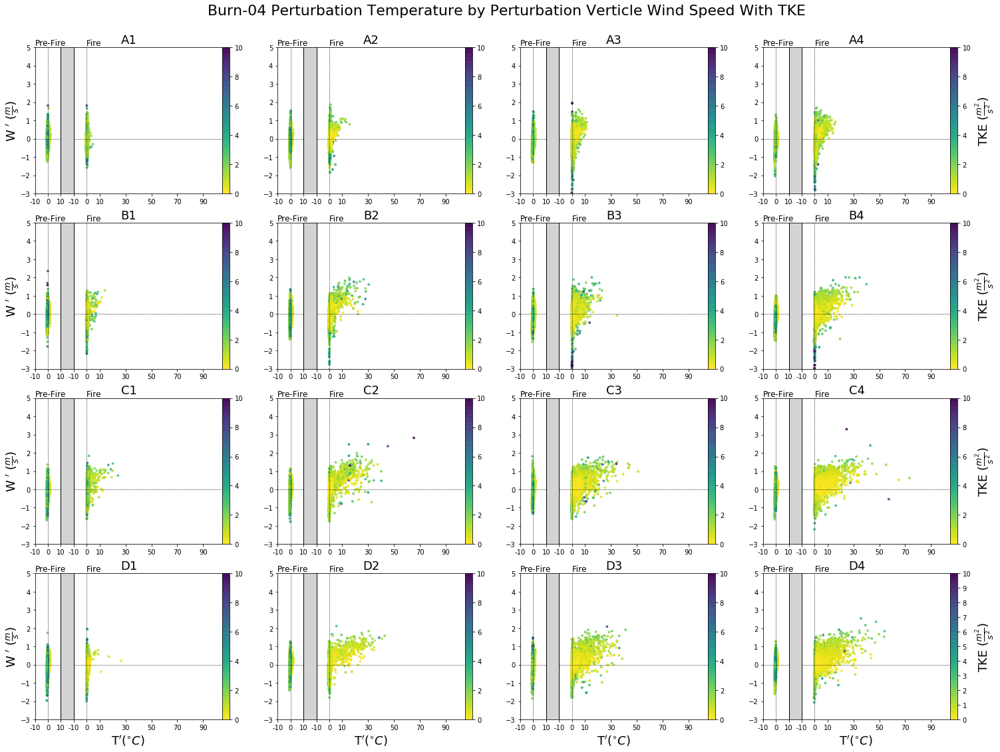

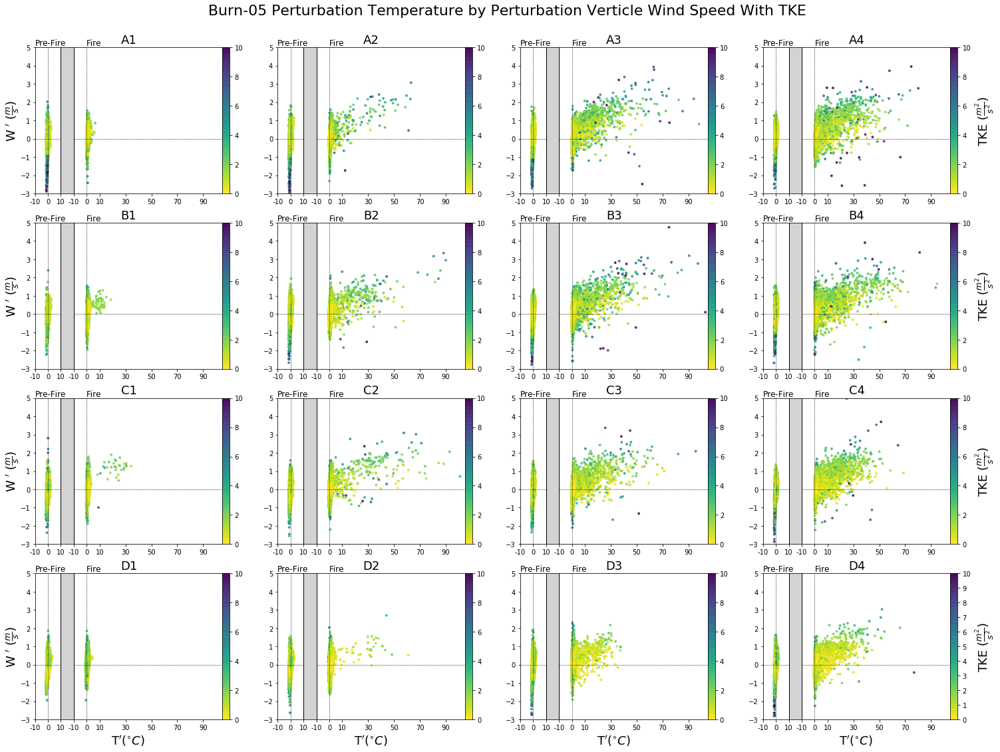

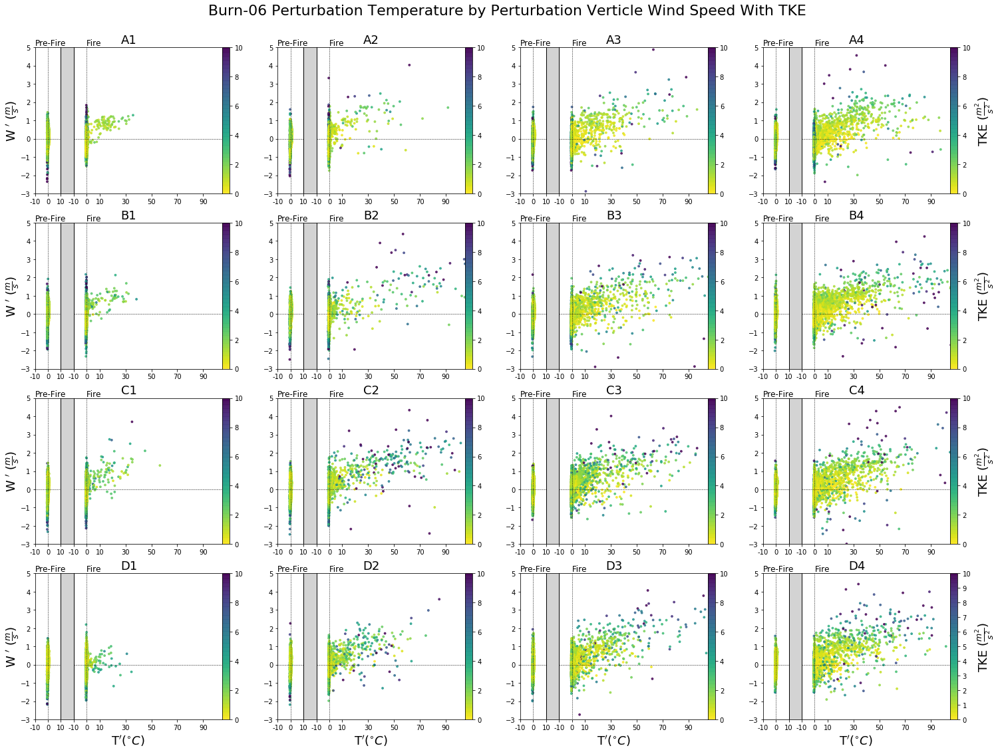

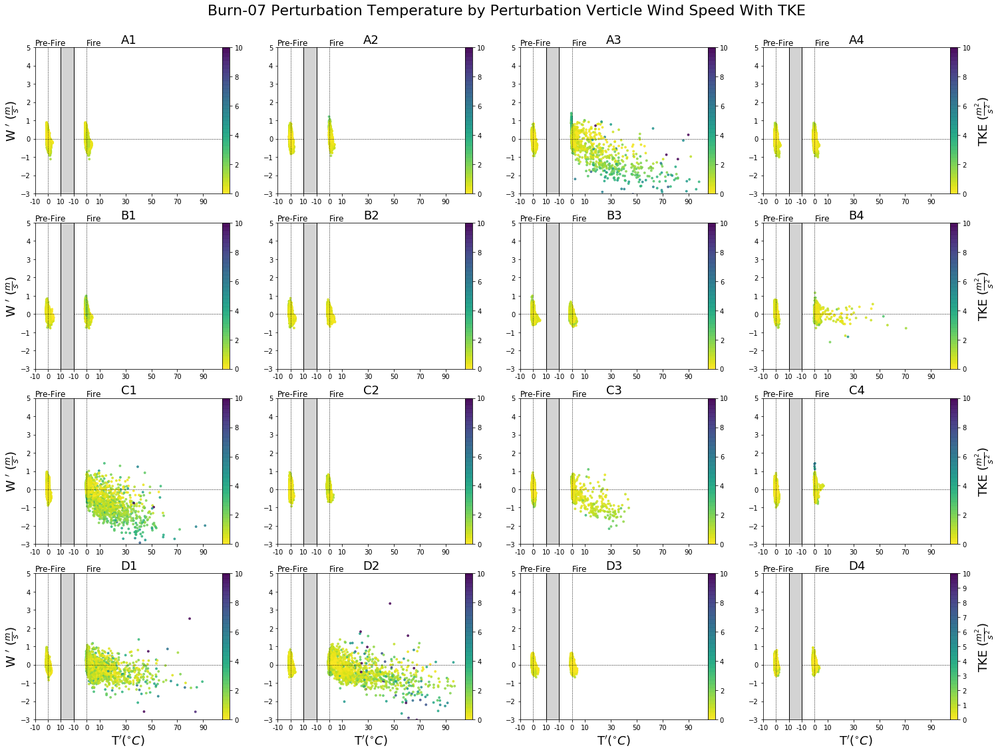

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: Mean of empty slice
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: Mean of empty slice
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: Mean of empty slice
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: Mean of empty slice


TypeError: cannot do slice indexing on <class 'pandas.core.indexes.range.RangeIndex'> with these indexers [90000000000.0] of <class 'float'>

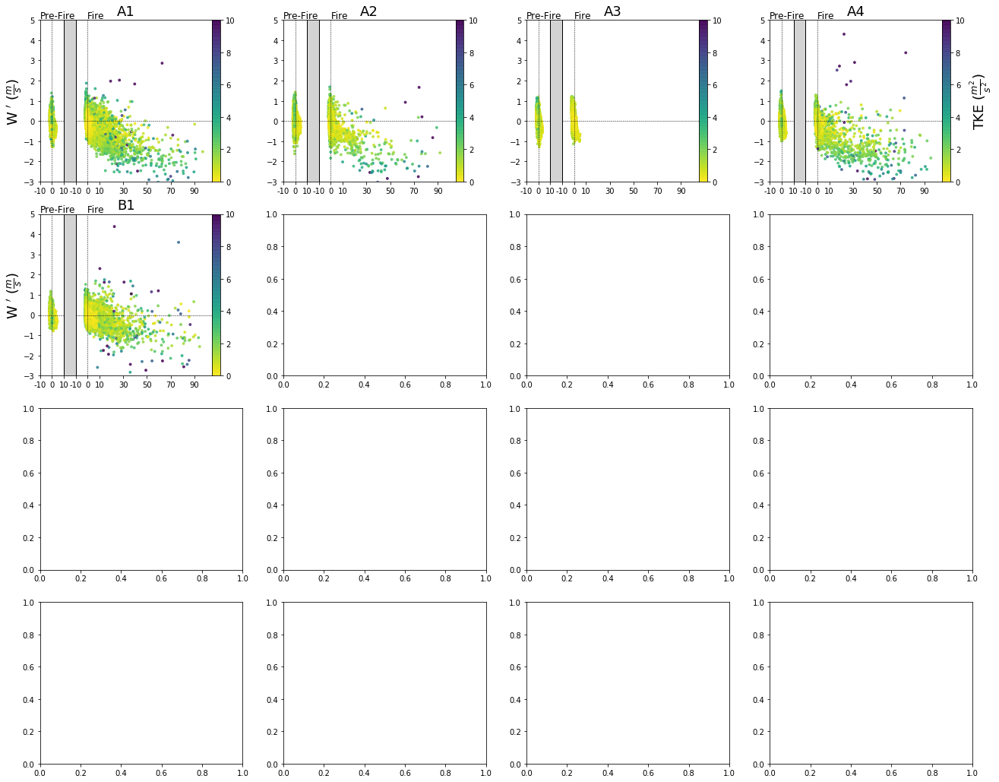

In [278]:
n_list = [21000,15000,20000,30000,15000,6000,25000,18000,30000,60000,50000,180000,40000,25000,25000,27000,\
         45000,20000,25000,25000,35000,27000,25000,15000,35000,45000,20000,40000]
#path = "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Split-Times/Burn-"
#path="/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Full-Timestamp/Burn-" #79 
path = "/Users/joeyp/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Full-Timestamp/Burn-" #w10
path_end = "/sonics/"
burns = ["01","02","03","04","05","06","07","08","11","12","13","18","19","20", \
         "21","22","23","24","25","26","27", "28","29","30","31","32","33","34"]
for i in range(len(burns)):
    p=path+burns[i]+path_end
    tke_grid(p,n_list[i],"Burn-"+burns[i])

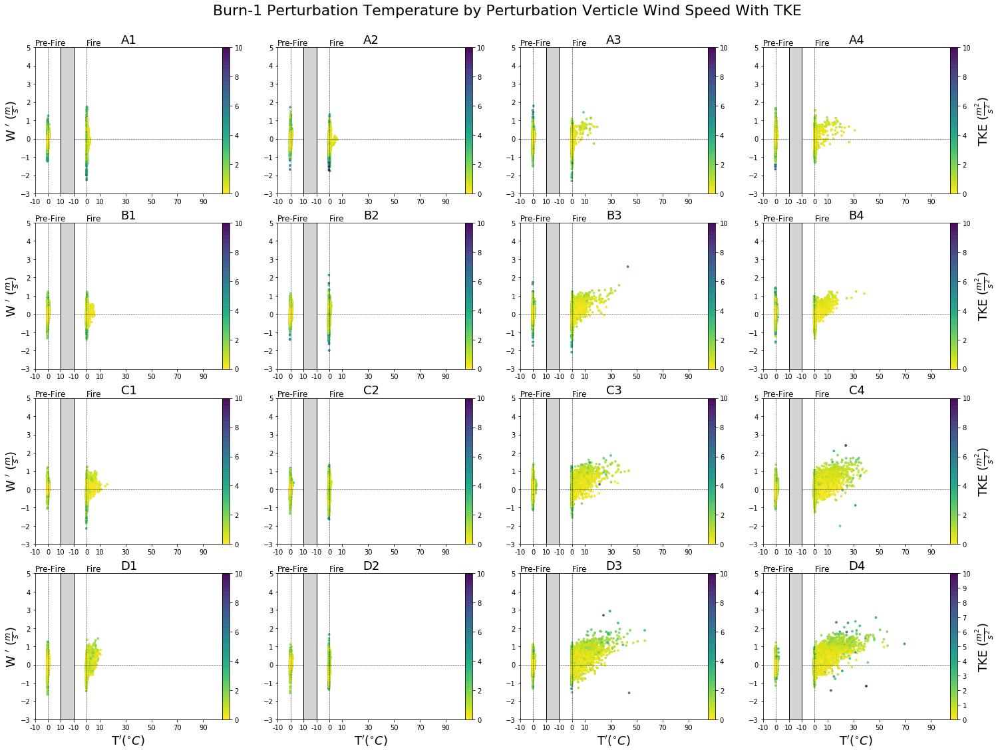

In [270]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-1/sonics/"
path = "/Users/joeyp/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Full-Timestamp/Burn-01/sonics/"
tke_grid(path,21000 ,"Burn-1")

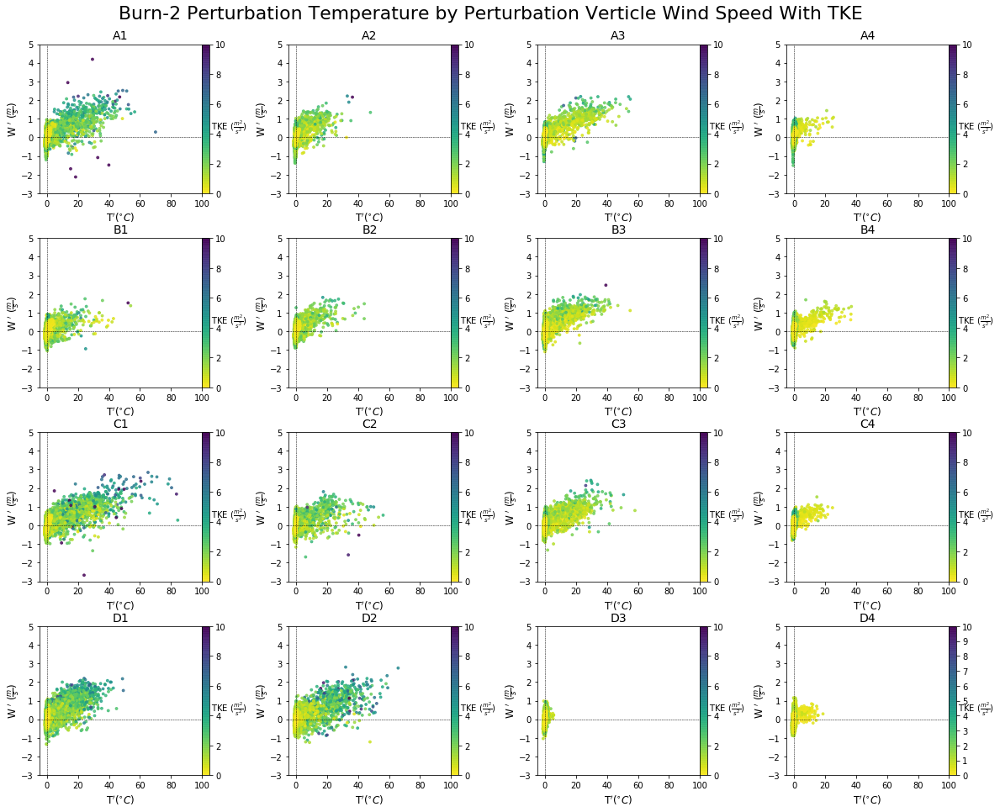

In [16]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-2/sonics/"
path = "/Users/joeyp/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Full-Timestamp/Burn-02/sonics/"
tke_grid(path,15000,"Burn-2")

## Old TKE

In [ ]:
import os   #used for directory work
import matplotlib.patches as mpatches #used for plot legends
import matplotlib.pyplot as plt #used for creating plots
import matplotlib.cm as cm
import pandas as pd
import numpy as np
%matplotlib inline

In [ ]:
#path="/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-1/sonics/" #79 location
#path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-2/sonics/"  #134 location
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-2/sonics/"
def text_finder(path):
    txt_files=[]
    all_files = os.listdir(path) #tells what directory the files are in
    for i in all_files: #reading only the .txt files 
        if i[-4:] == ".txt":
            txt_files.append(i)
    txt_files.sort() #alphabetizes them
    return txt_files

In [ ]:
print("W full-average:",np.mean(df["W"]))
print("W cut-average:",np.mean(df["W"][:16000]))
print("W cut-average:",np.average(df["W"][:16000]))
print()
print("U full-average:",np.mean(df["U"]))
print("U cut-average:",np.mean(df["U"][:16000]))
print()
print("V full-average:",np.mean(df["V"]))
print("V cut-average:",np.mean(df["V"][:16000]))
print()
print("T full-average:",np.mean(df["T"]))
print("T cut-average:",np.mean(df["T"][:16000]))

In [ ]:
def calculations(df, n):   
    U_average = np.mean(df["U"][:n])
    V_average = np.mean(df["V"][:n])
    W_average = np.mean(df["W"][:n])
    T_average = np.mean(df["T"][:n])

    tke_lst, V_prime, U_prime, W_prime, T_prime = [], [], [], [], []
    for i in range(len(df)):
        tke_lst.append(((df["U"][i] - U_average)**2 +(df["V"][i] - V_average)**2 + (df["W"][i]-W_average)**2)/2)
        V_prime.append(df["V"][i]-V_average)
        U_prime.append(df["U"][i]-V_average)
        W_prime.append(df["W"][i]-W_average)
        T_prime.append(df["T"][i]-T_average)
        
    return tke_lst, W_prime, T_prime, V_prime, U_prime

In [ ]:
tke_lst, W_prime, T_prime, V_prime, U_prime  = calculations(df,16000)

In [ ]:
def tke_plots(df,file_name,n):
    tke_lst, W_prime, T_prime, V_prime, U_prime  = calculations(df,n)
    #figure
    fig, ax = plt.subplots()
    fig.set_size_inches(16, 10)

    ax = plt.subplot(1,1,1)

    #labels
    ax.set_xlabel(r'Perturbation Temperature ($^{\circ}C$) ', fontsize=10)
    ax.set_ylabel(r'Perturbation Vertical Wind Speed ($\frac{m}{s}$)',rotation =90, fontsize=10 )
    title= r"T${}'$ vs W${}'$ with TKE "+ file_name[:2]
    ax.set_title(title, fontsize = 14)

    #c sequence
    c = tke_lst
    #cm = plt.cm.get_cmap('jet')
    cm = plt.cm.get_cmap('viridis_r')
    #cm = plt.cm.get_cmap('gnuplot')
    #plot
    plt.hlines(0,-50,100,linestyle= "--",  linewidth=.5)
    plt.vlines(0,-10,10,linestyle= "--",  linewidth=.5)
    plt.scatter( T_prime, W_prime , c=c, 
                cmap =cm, alpha = .7, s= 12 )# s = df['T']*.5, alpha =0.5)
    cbar = plt.colorbar(pad=0)
    cbar.set_label(r'TKE ($\frac{m^{2}}{s^{2}}$)', rotation=45, fontsize=10)
    
    plt.clim(0,10)
    cbar.set_ticks([0,1,2,3,4,5,6,7,8,9,10])
    plt.xlim(-5,100)
    plt.ylim(-3,5)
    plt.show()
    fig.savefig(str(file_name[:2])+'TKE_plot.png')

In [ ]:
for i in range(len(all_files)-1):
    df = pd.read_csv(path + txt_files[i],na_values = ['NAN', "00nan"], sep="\t")
    tke_plots(df,all_files[i],16000)

In [ ]:
def tke_grid(path,n,burn,seperator = " "):
    cm = plt.cm.get_cmap('viridis_r')
    fig, axs = plt.subplots(nrows=4,ncols=4)#, sharex=True, sharey=True)
    fig.set_size_inches(20, 16)
    txt_files = text_finder(path)
    x=0
    for col in range(4):
        for row in range(4):
            #read in the data and compute means
            df = pd.read_csv(path + txt_files[x],na_values = ['NAN', "00nan"], sep=seperator)  
            tke_lst, W_prime, T_prime, V_prime, U_prime  = calculations(df,n)
            
            #create the scatter subplots
            ax = axs[ col, row]
            pcm =ax.scatter(T_prime, W_prime , c=tke_lst, 
                cmap =cm, alpha = .8, s= 8,vmin = 0, vmax=10)

            #Set the colorbar
            cbar = fig.colorbar(pcm, ax = ax, pad =0)
            cbar.set_label(r'TKE ($\frac{m^{2}}{s^{2}}$)', rotation=0, fontsize=10)
            #titles and formating 
            ax.set_title(txt_files[x][:2], fontsize = 14)
            ax.set_xlabel(r"T${}'$($^{\circ}C$) ", fontsize=12)
            ax.set_ylabel(r"W ${}'$ ($\frac{m}{s}$)",rotation =90, fontsize=12,labelpad=0 )
            ax.hlines(0,-50,100,linestyle= "--",  linewidth=.5)
            ax.vlines(0,-10,10,linestyle= "--",  linewidth=.5)
            ax.set_ylim(-3,5)
            ax.set_xlim(-5,100)
            x=x+1 #used to change the files

    #adjust the spacingof the plots 
    plt.subplots_adjust(hspace=.3,wspace=.3)       
    fig.suptitle(burn+' Perturbation Temperature by Perturbation Verticle Wind Speed With TKE ', fontsize = 22, x=0.5, y=0.92)
    cbar.set_ticks([0,1,2,3,4,5,6,7,8,9,10])

    fig.savefig(burn+"_T-W-tke_Grid.png",dpi=250)

In [ ]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-1/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-1/sonics/"
tke_grid(path,21000 ,"Burn-1")


In [ ]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-2/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-2/sonics/"
tke_grid(path,15000,"Burn-2")


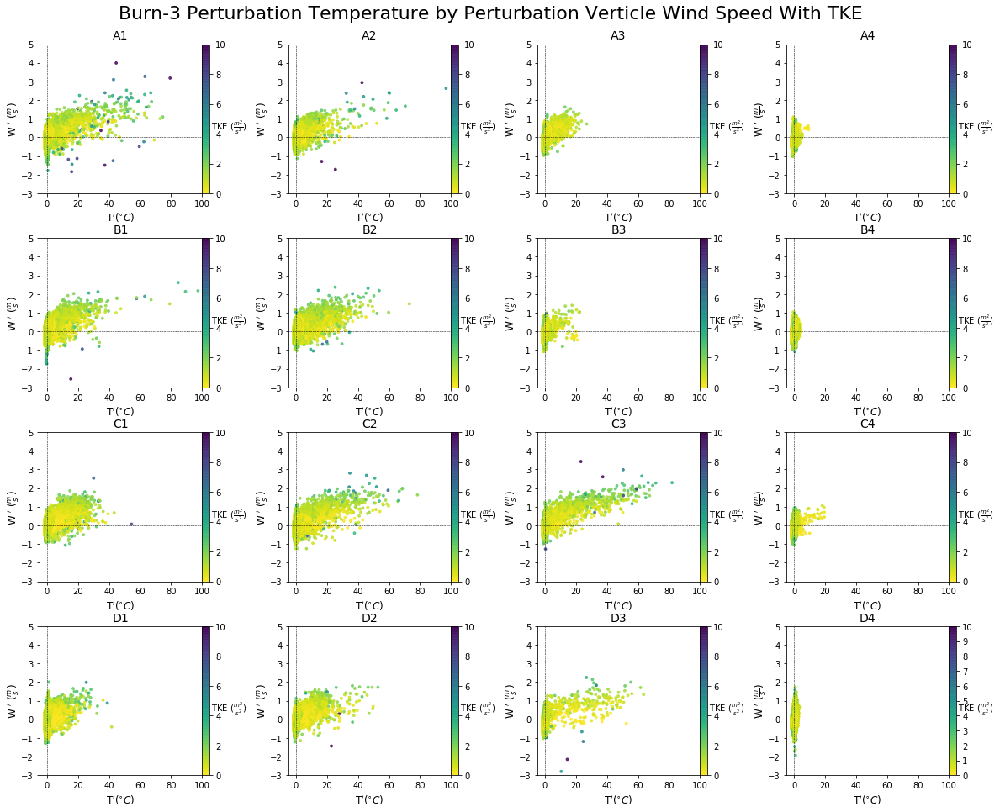

In [17]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-3/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-3/sonics/"
tke_grid(path,20000 ,"Burn-3")

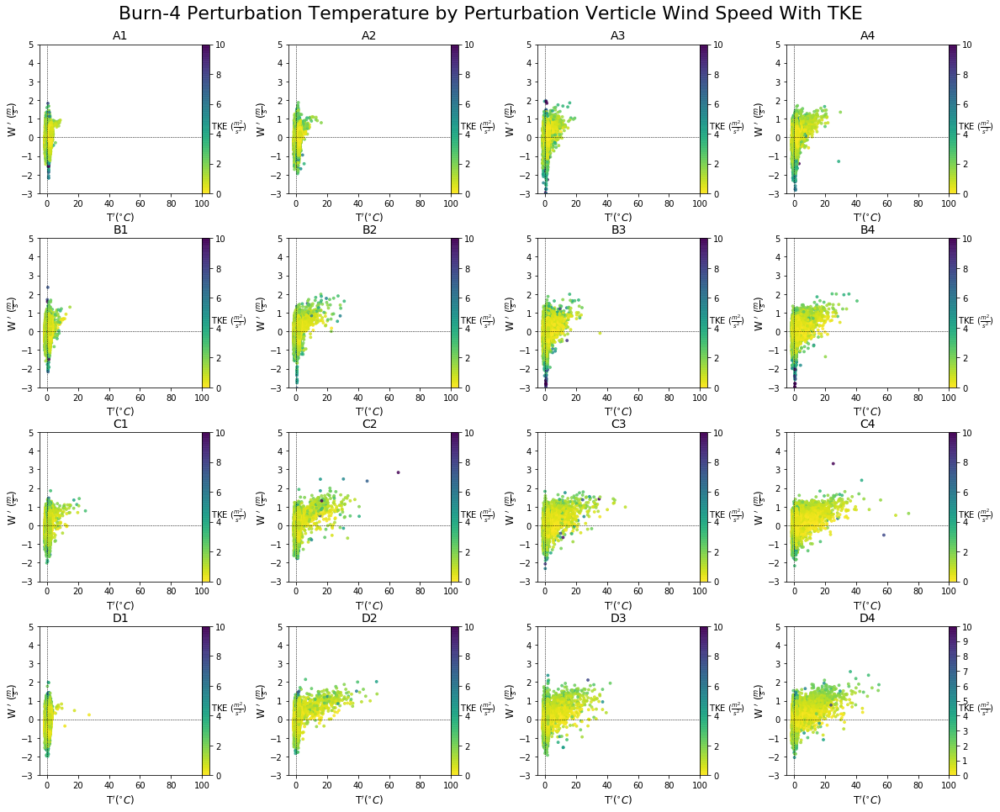

In [10]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-4/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-4/sonics/"
tke_grid(path,30000 ,"Burn-4")

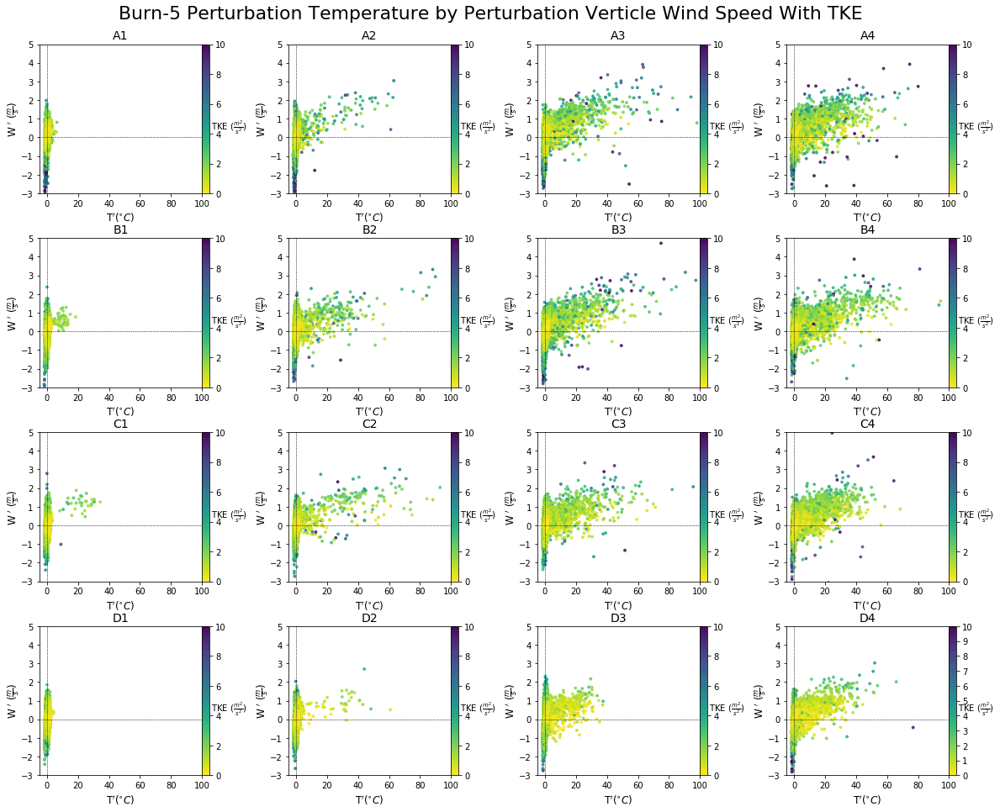

In [11]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-5/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-5/sonics/"
tke_grid(path,16000 ,"Burn-5")

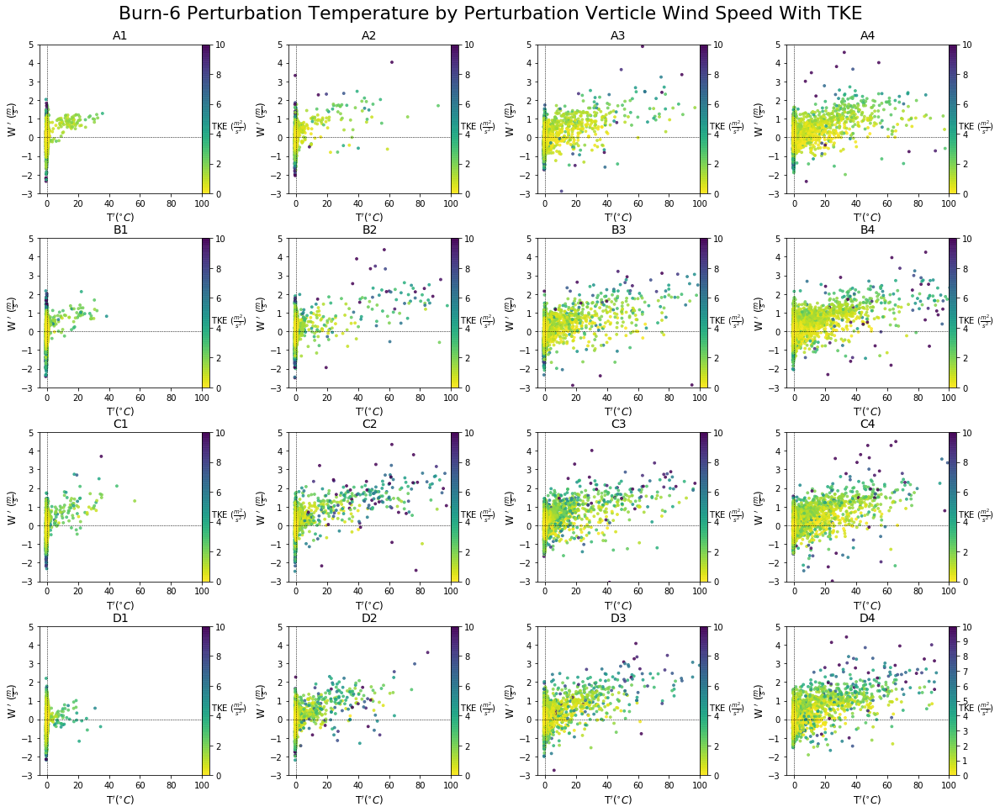

In [15]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-6/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-6/sonics/"
tke_grid(path,6000 ,"Burn-6")

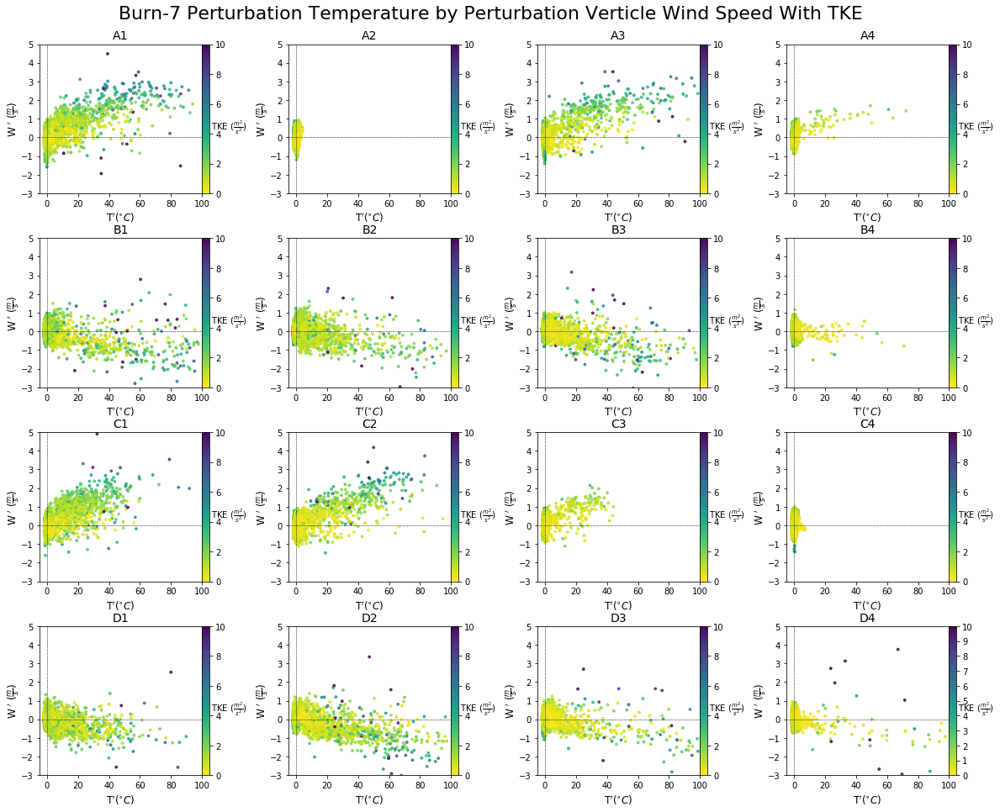

In [13]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-7/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-7/sonics/"
tke_grid(path,25000 ,"Burn-7")

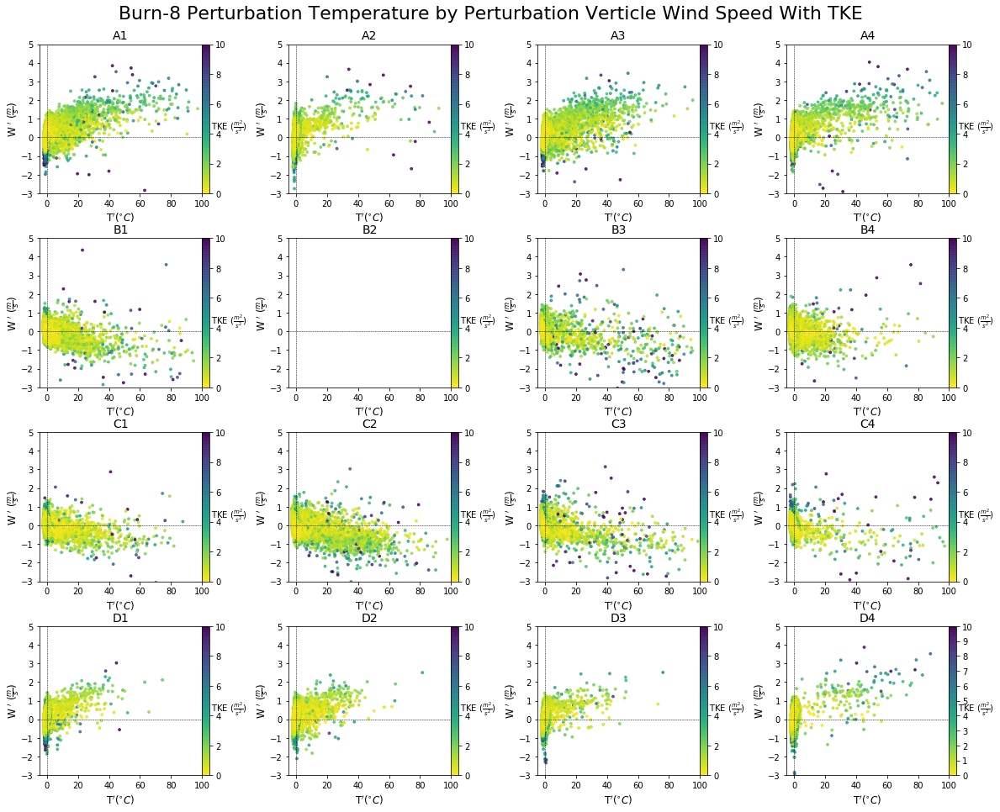

In [14]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-8/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-8/sonics/"
tke_grid(path,18000 ,"Burn-8")

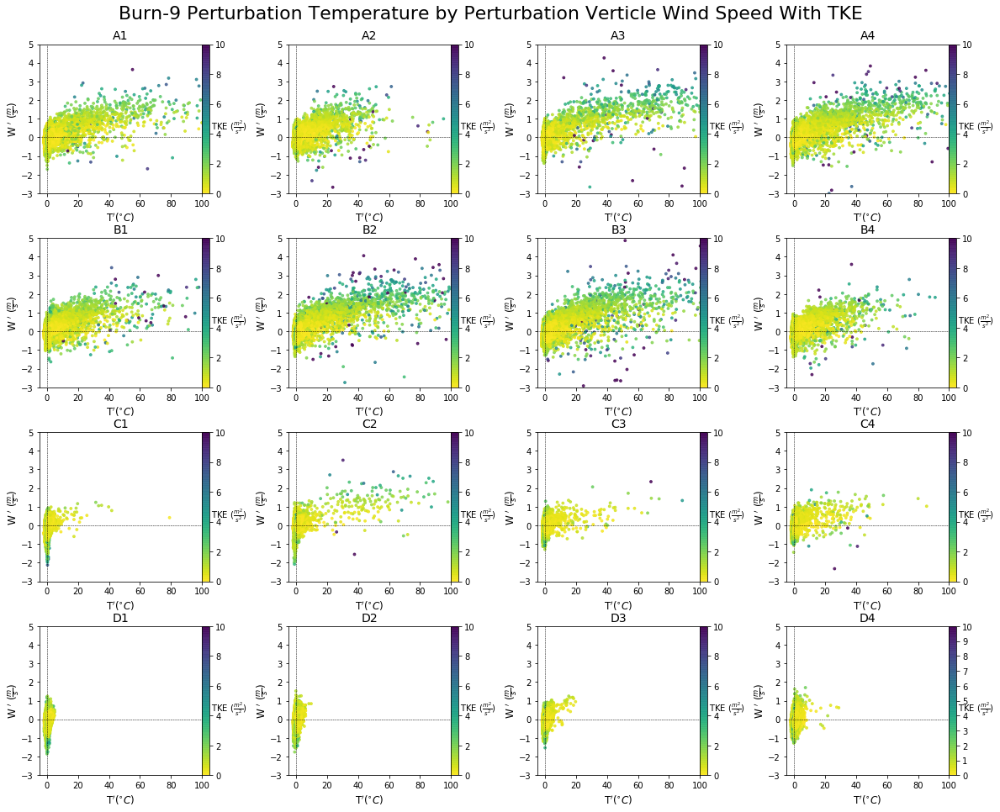

In [6]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-9/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-9/sonics/"
tke_grid(path,20000 ,"Burn-9")

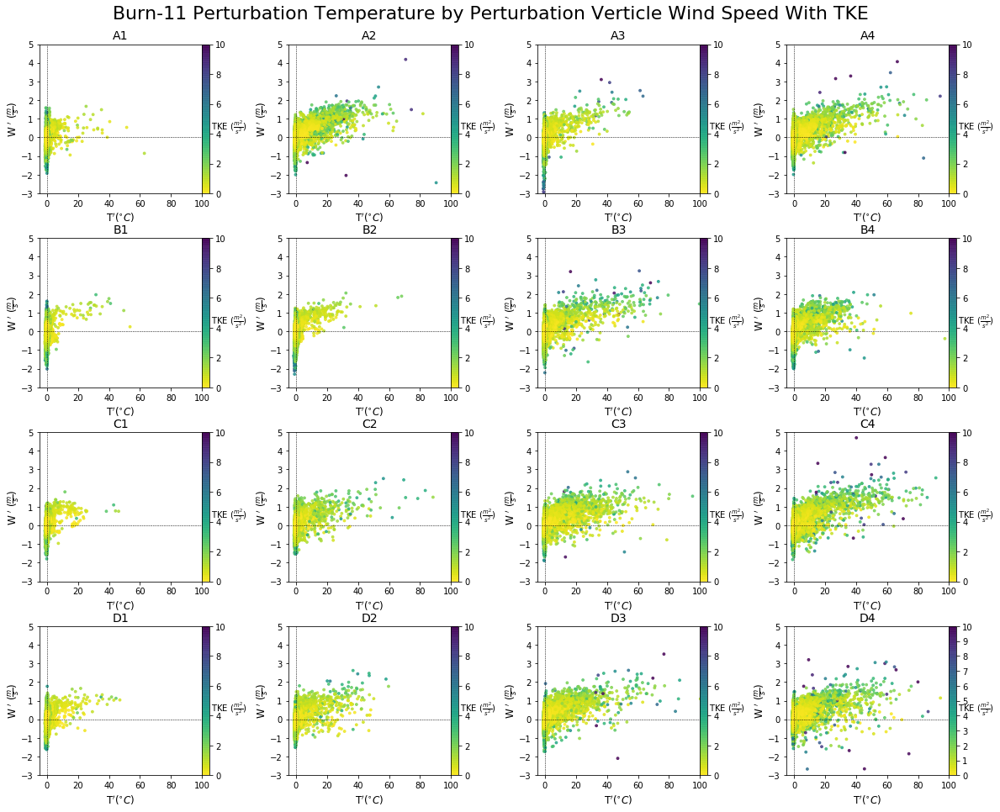

In [18]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-11/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-11/sonics/"
tke_grid(path,30000 ,"Burn-11")

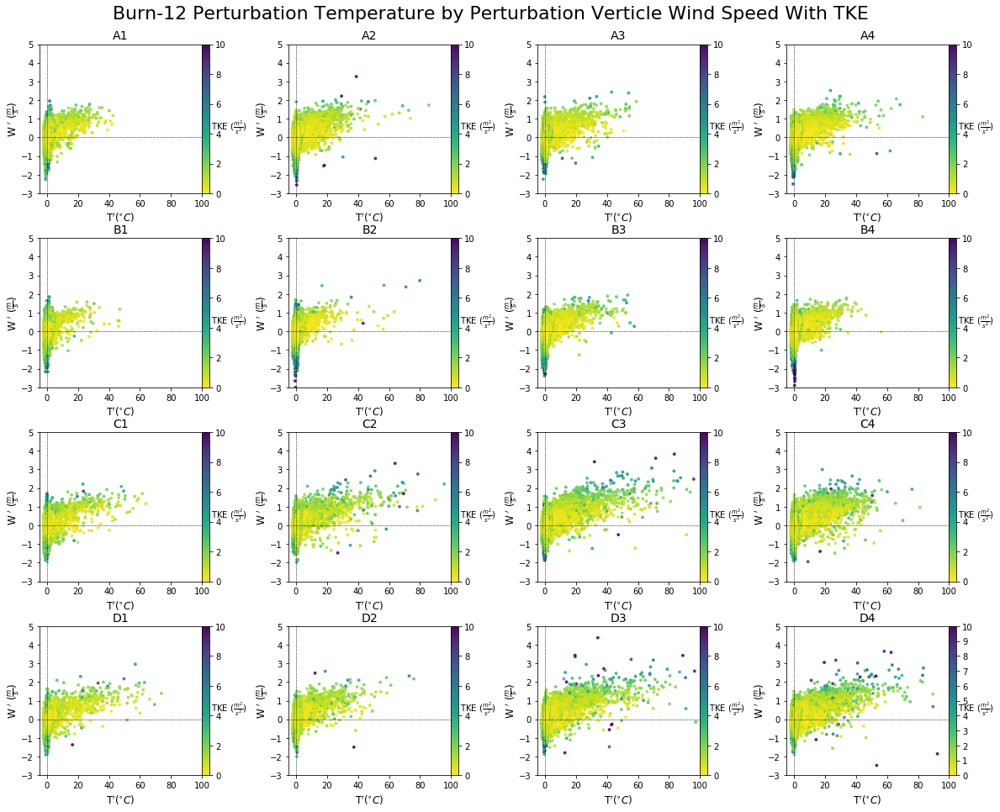

In [19]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-12/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-12/sonics/"
tke_grid(path,60000 ,"Burn-12")

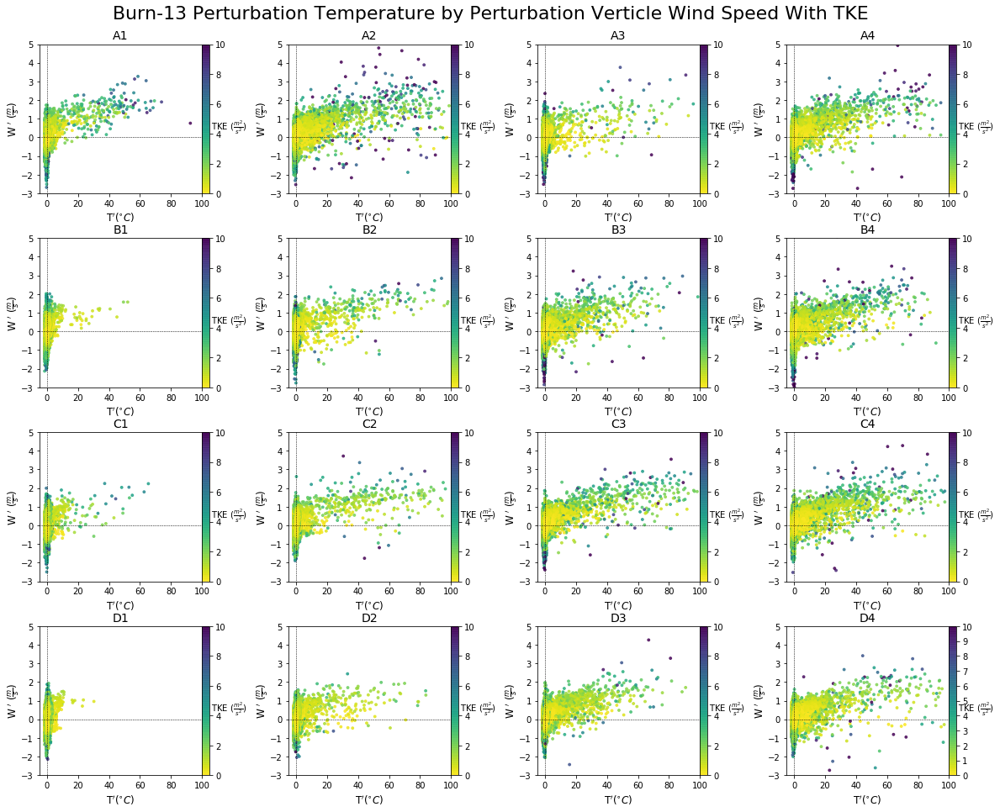

In [20]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-13/sonics/"
tke_grid(path,50000 ,"Burn-13")

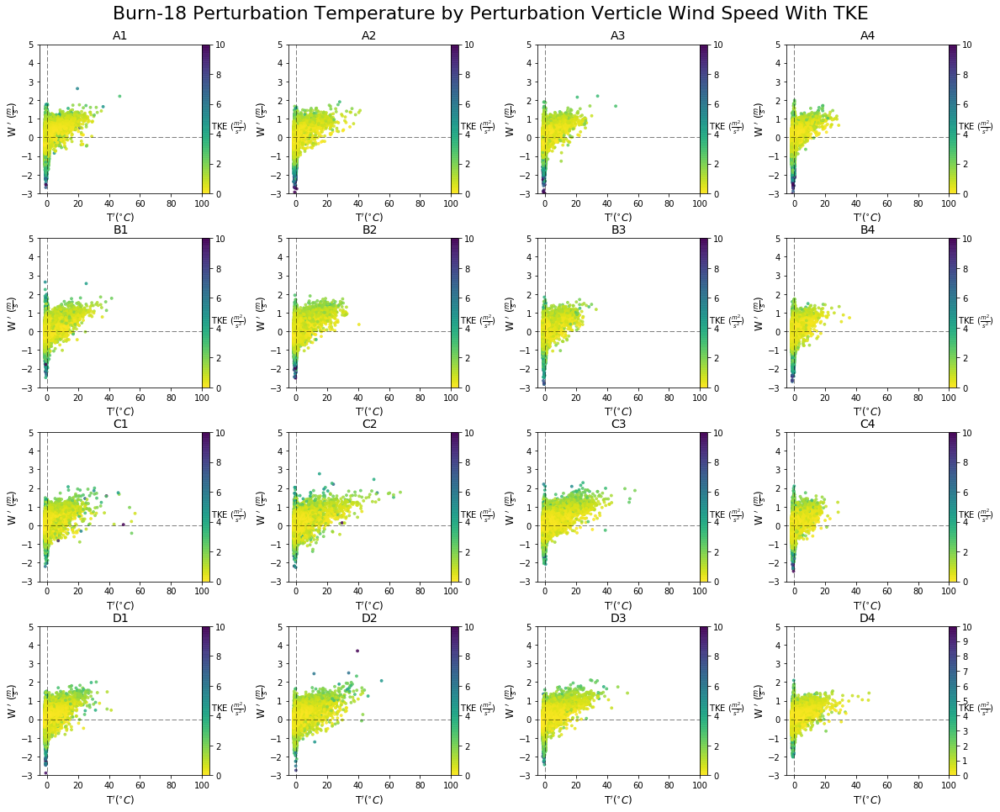

In [5]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-18/sonics/"  #134 location
tke_grid(path,180000 ,"Burn-18")

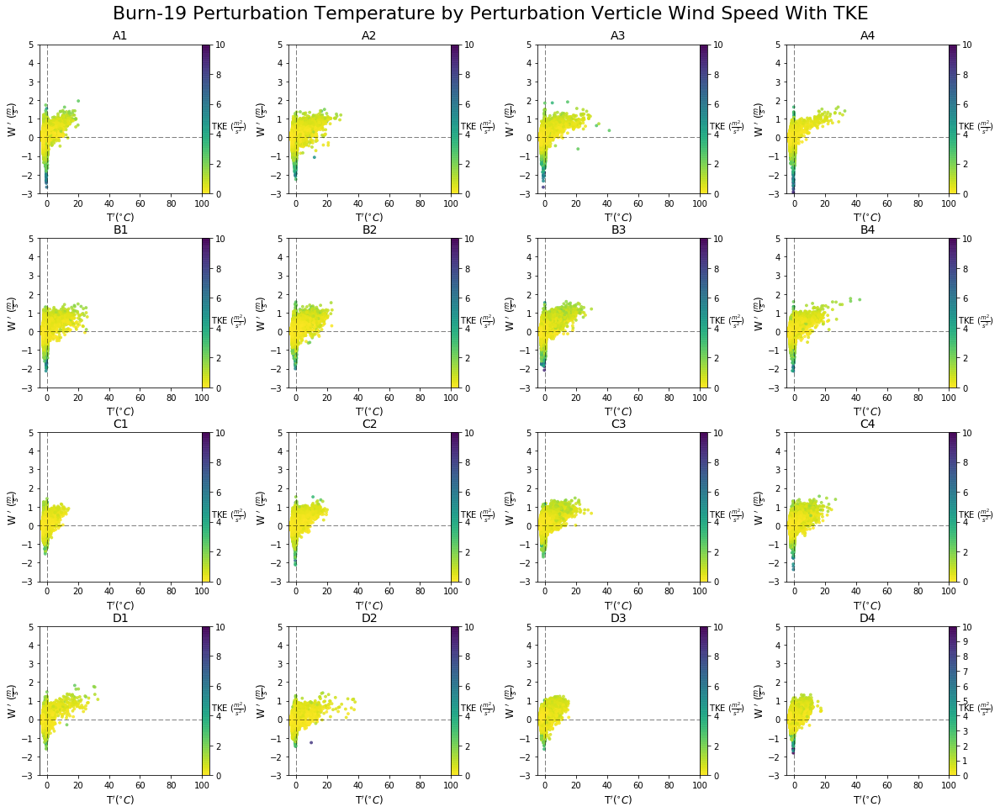

In [6]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-19/sonics/"  #134 location
tke_grid(path,40000 ,"Burn-19")

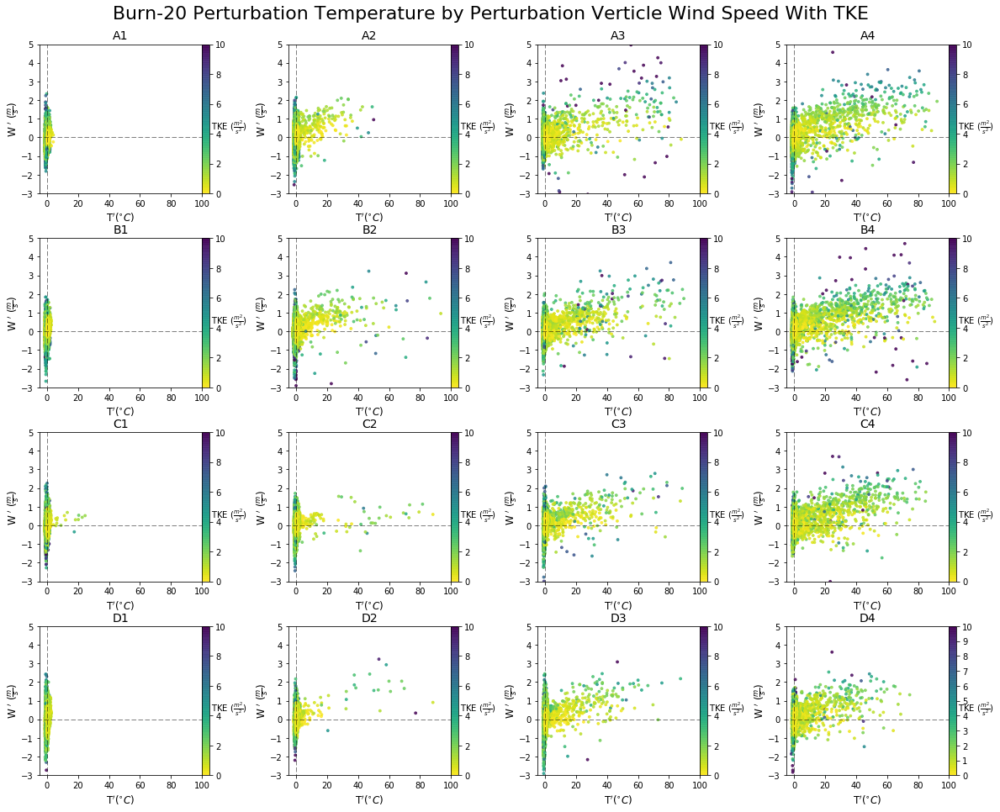

In [7]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-20/sonics/"  #134 location
tke_grid(path,25000 ,"Burn-20")

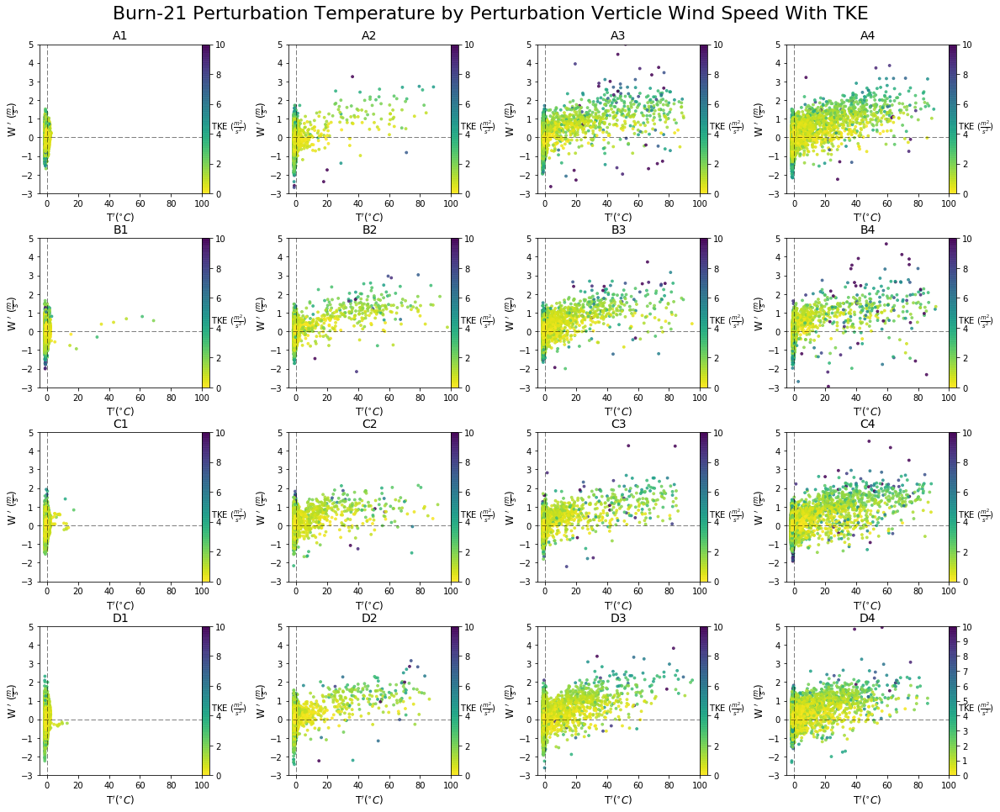

In [8]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-21/sonics/"  #134 location
tke_grid(path,25000 ,"Burn-21")

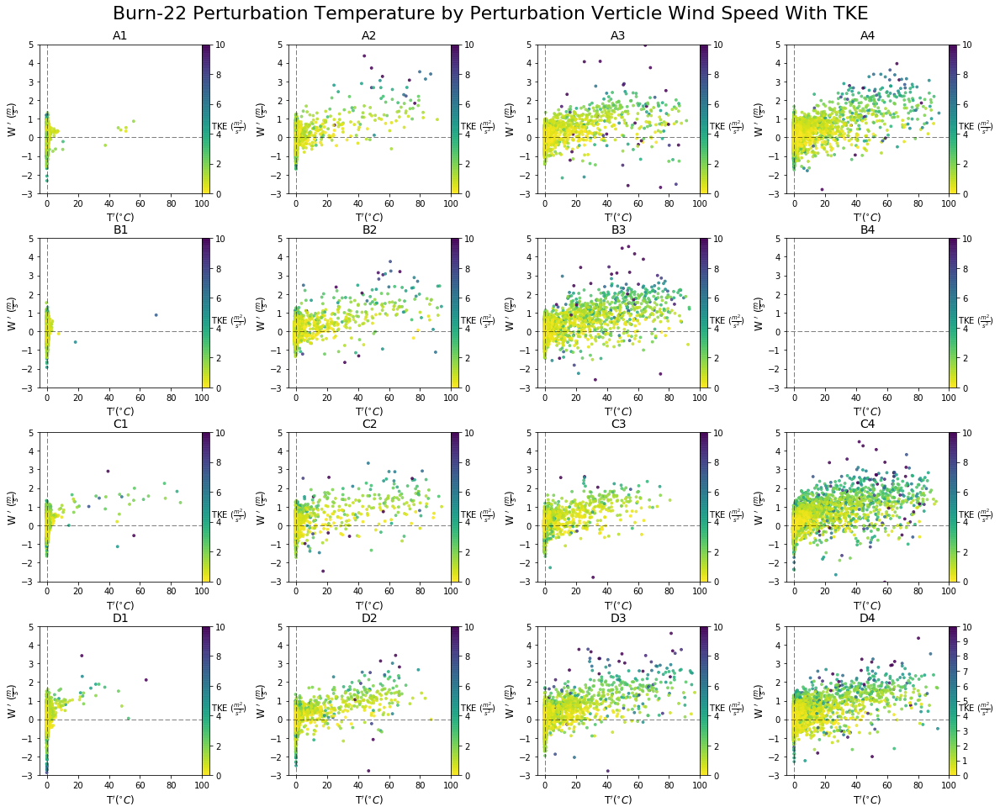

In [9]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-22/sonics/"  #134 location
tke_grid(path,27000 ,"Burn-22")

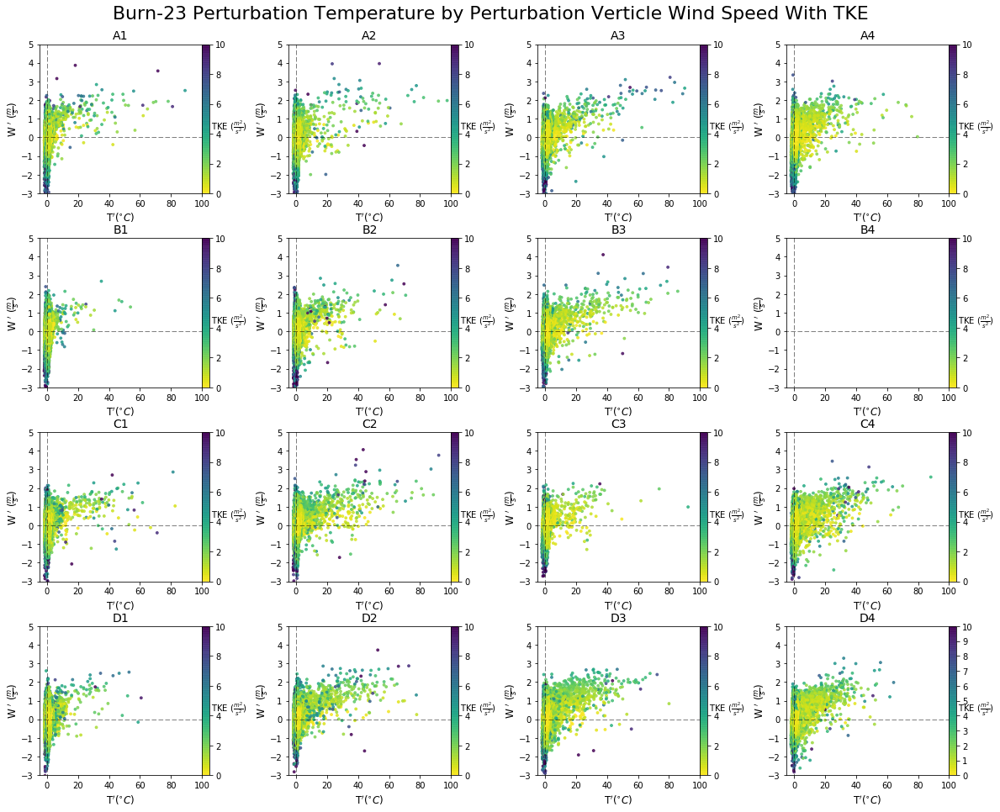

In [10]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-23/sonics/"  #134 location
tke_grid(path,45000 ,"Burn-23")

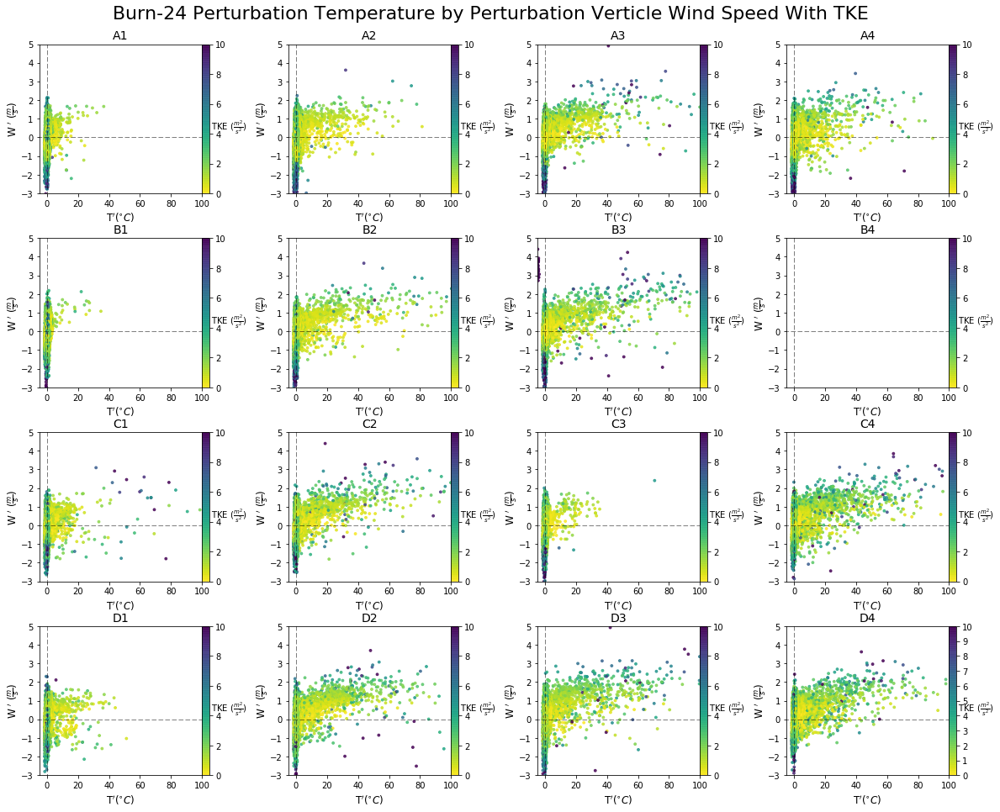

In [11]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-24/sonics/"  #134 location
tke_grid(path,20000 ,"Burn-24")

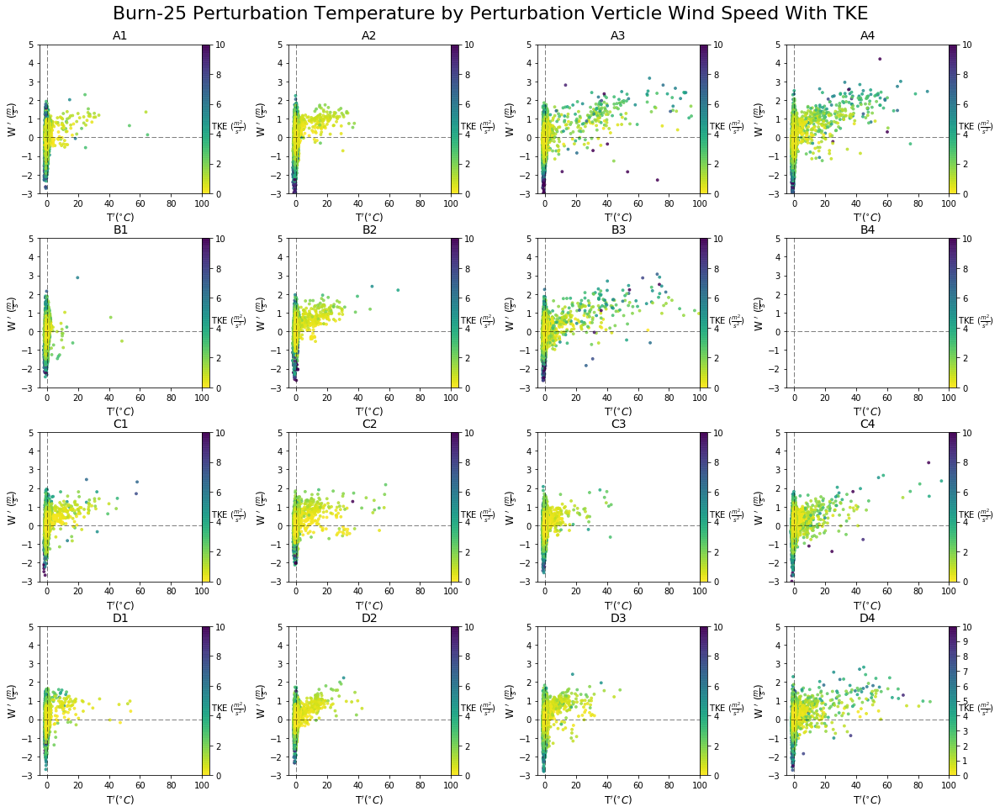

In [12]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-25/sonics/"  #134 location
tke_grid(path,25000 ,"Burn-25")

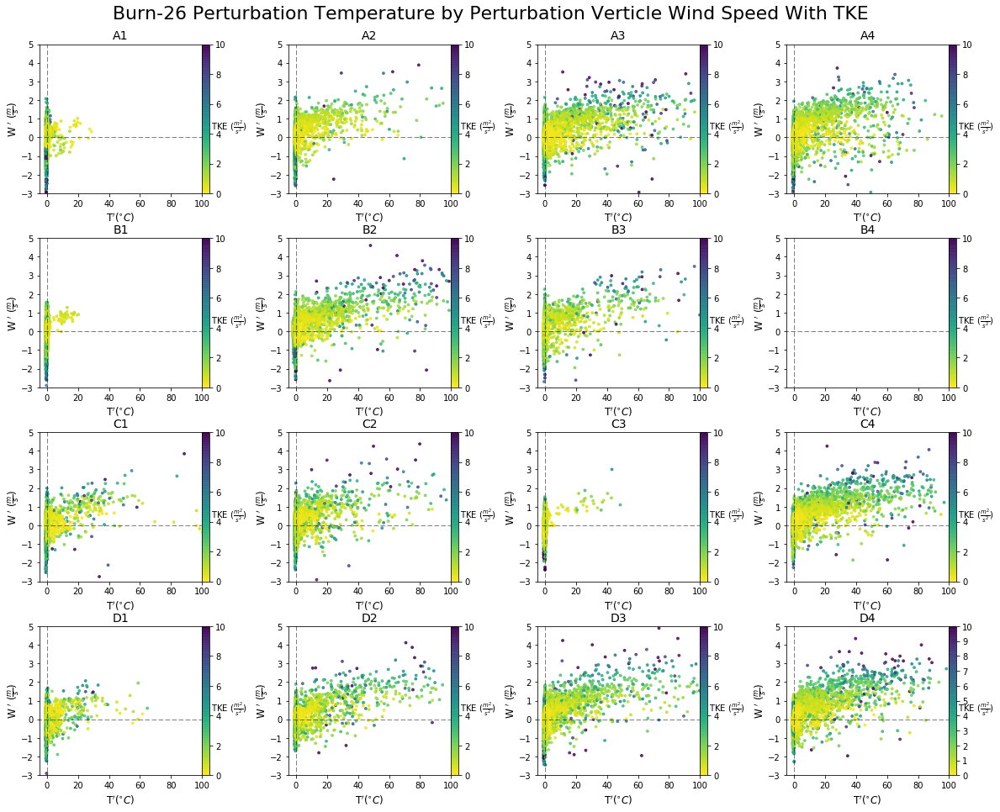

In [13]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-26/sonics/"  #134 location
tke_grid(path,25000 ,"Burn-26")

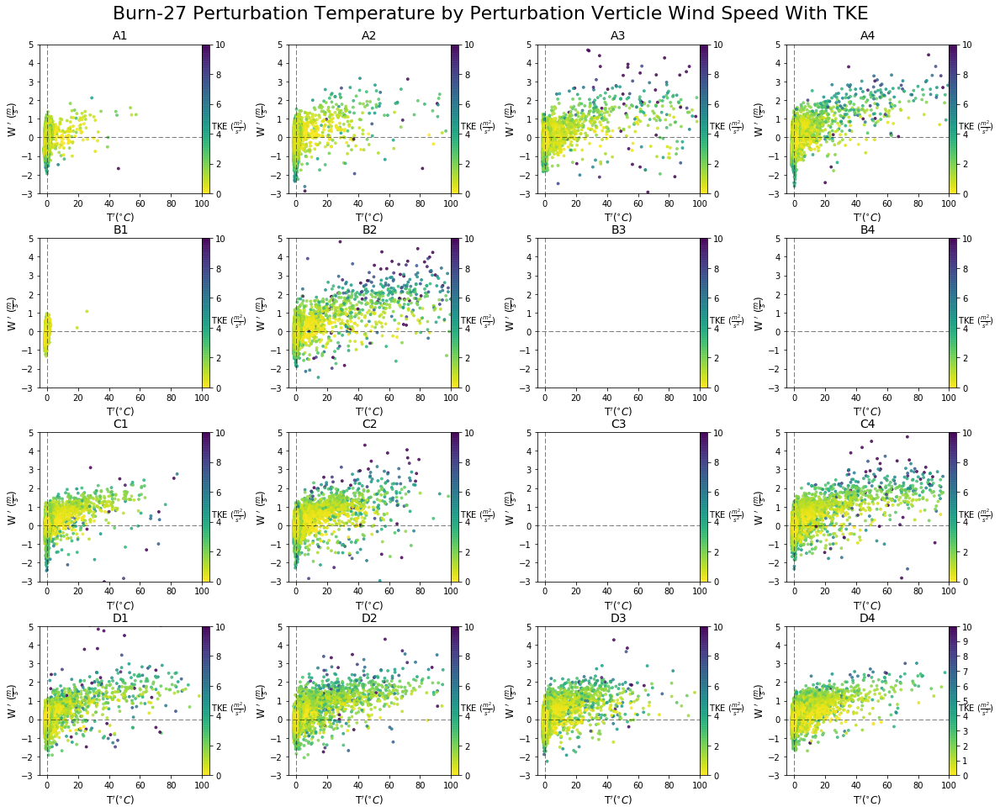

In [14]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-27/sonics/"  #134 location
tke_grid(path,35000 ,"Burn-27")

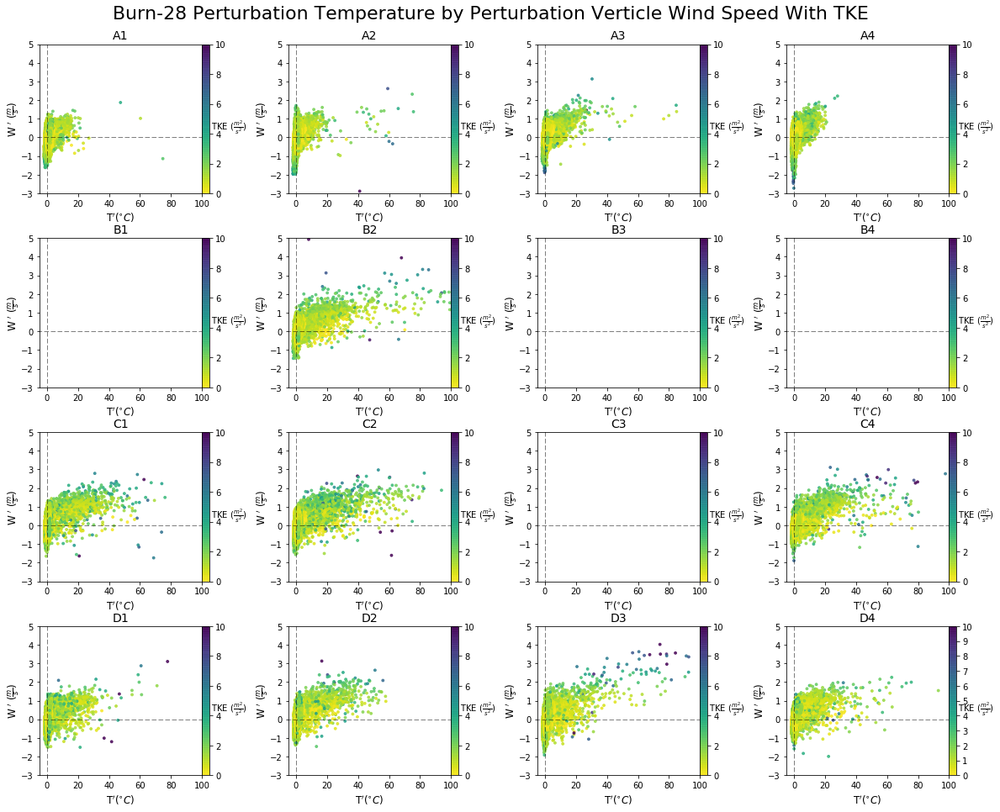

In [15]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-28/sonics/"  #134 location
tke_grid(path,27000 ,"Burn-28")

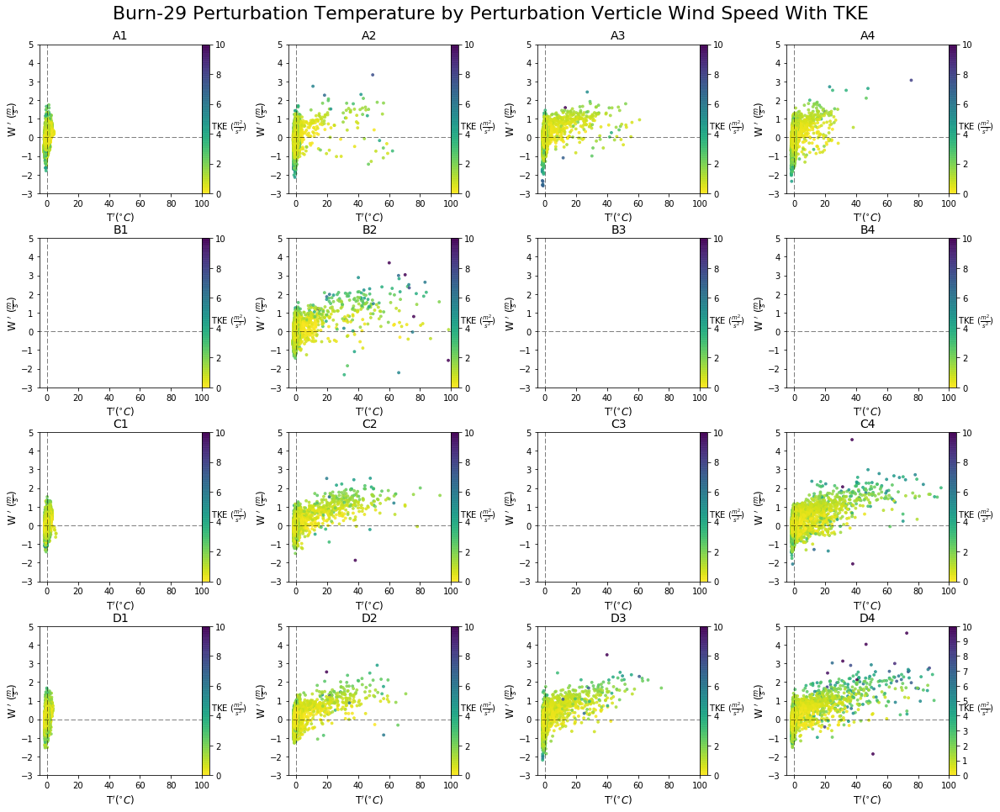

In [16]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-29/sonics/"  #134 location
tke_grid(path,25000 ,"Burn-29")

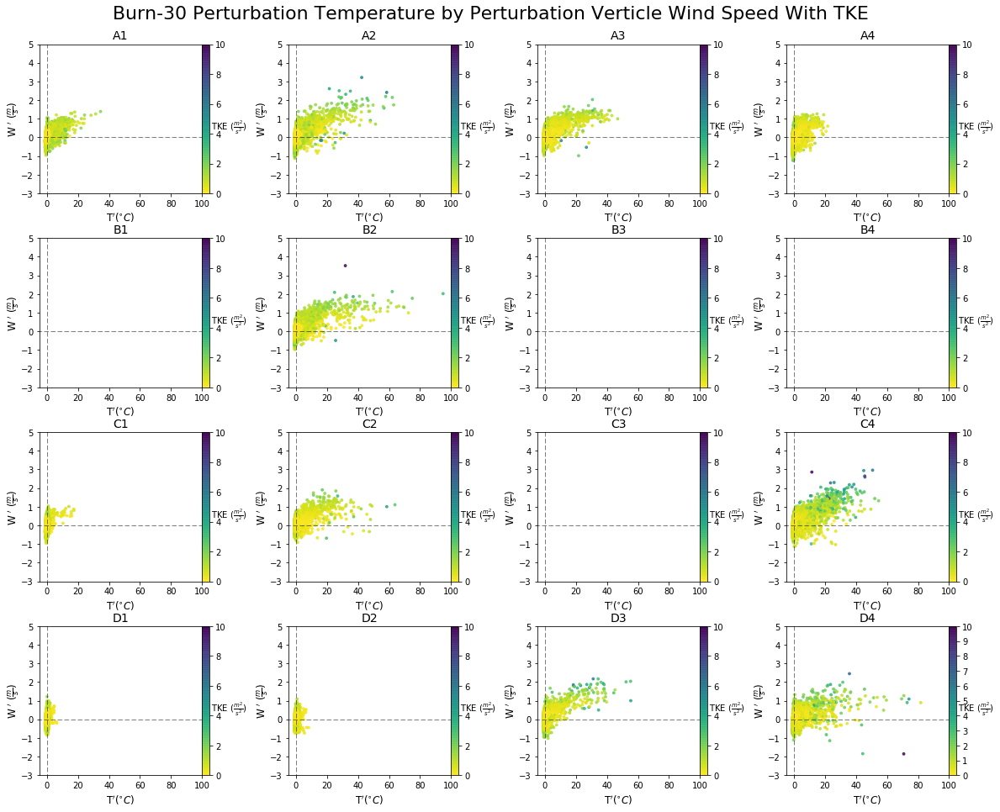

In [17]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-30/sonics/"  #134 location
tke_grid(path,15000 ,"Burn-30")

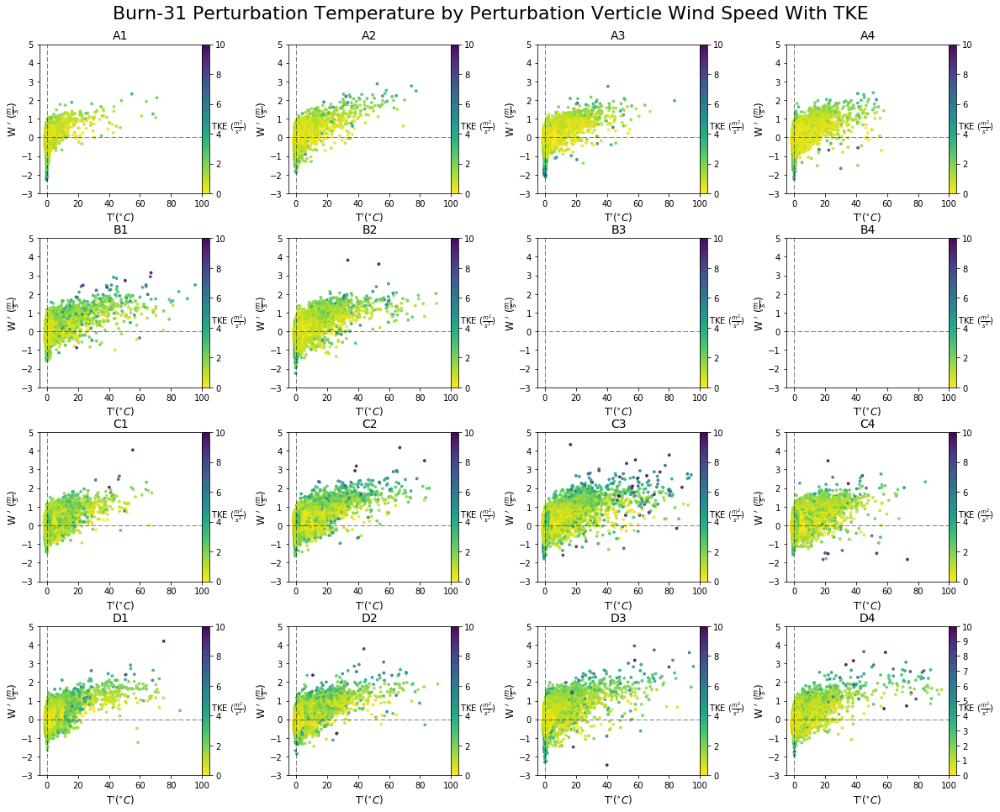

In [18]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-31/sonics/"  #134 location
tke_grid(path,35000 ,"Burn-31")

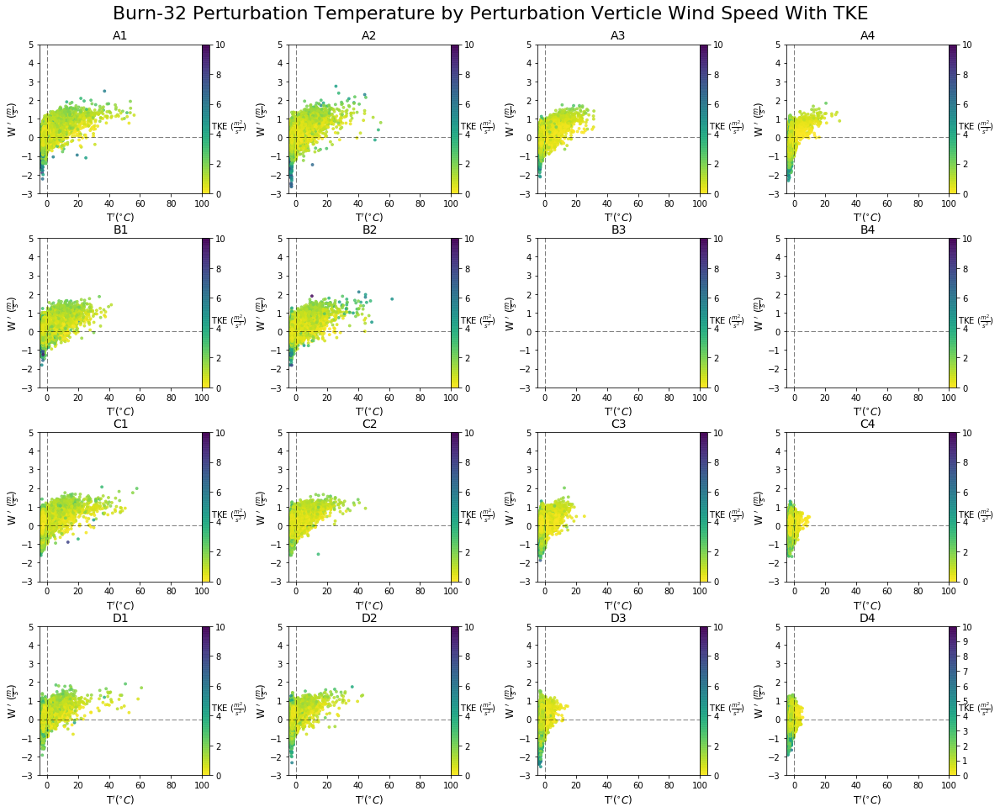

In [19]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-32/sonics/"  #134 location
tke_grid(path,45000 ,"Burn-32")

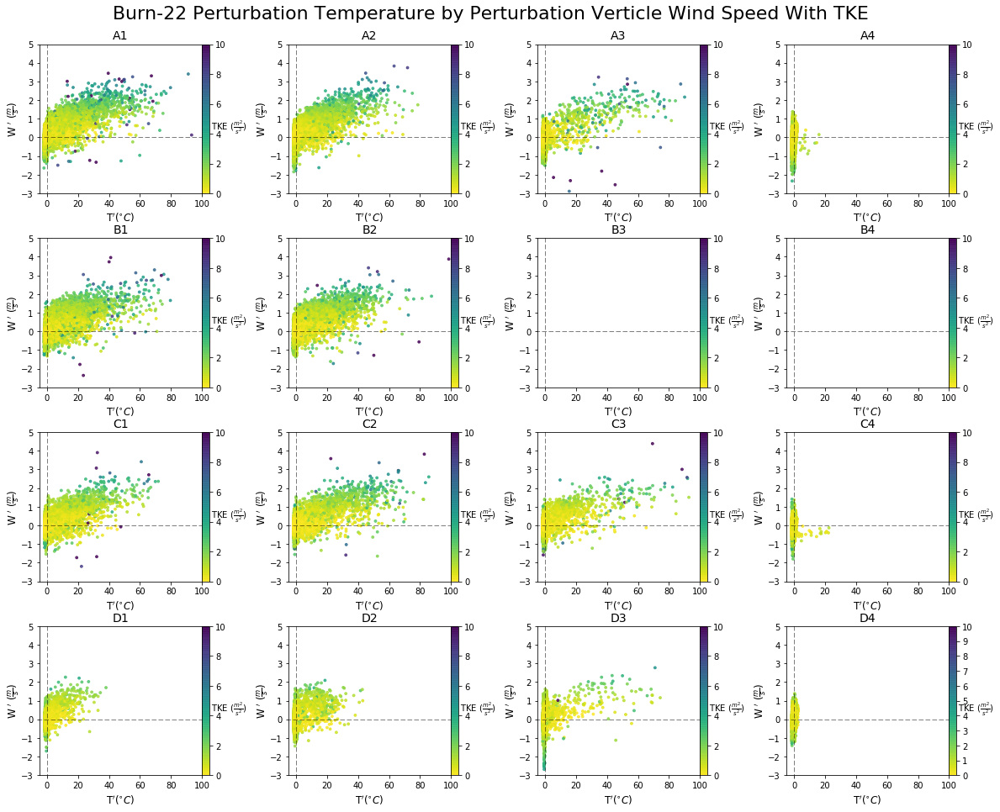

In [20]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-33/sonics/"  #134 location
tke_grid(path,20000 ,"Burn-22")

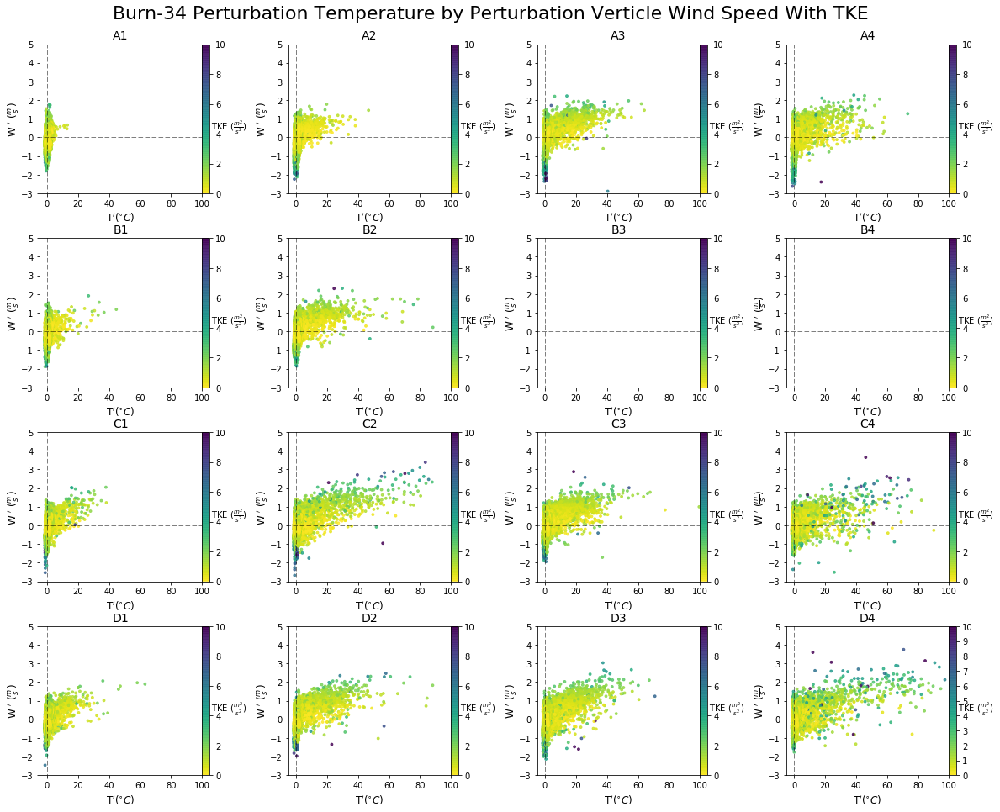

In [21]:
#path = "/Users/joeyp/Desktop/Forestry/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
#path = "/home/joey/Desktop/10X10_Truss_SERDP_Burns_May_2018/JS_Cleaned_Data/Burn-13/sonics/"
path= "/home/JoeySeitz/10X10_Truss_SERDP_Burns/JS_Cleaned_Data/Burn-34/sonics/"  #134 location
tke_grid(path,40000 ,"Burn-34")